<a href="https://colab.research.google.com/github/nsattiraju/GAN-Tutorial/blob/main/Tutorial_GAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Generative Adversarial Networks (GANs)

In 2014, [Goodfellow et al.](https://arxiv.org/abs/1406.2661) presented a method for training generative models called Generative Adversarial Networks (GANs for short). In a GAN, we build two different neural networks. Our first network is a traditional classification network, called the **discriminator**. We will train the discriminator to take images, and classify them as being real (belonging to the training set) or fake (not present in the training set). Our other network, called the **generator**, will take random noise as input and transform it using a neural network to produce images. The goal of the generator is to fool the discriminator into thinking the images it produced are real.

We can think of this back and forth process of the generator ($G$) trying to fool the discriminator ($D$), and the discriminator trying to correctly classify real vs. fake as a minimax game:
$$\underset{G}{\text{minimize}}\; \underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
where $z \sim p(z)$ are the random noise samples, $G(z)$ are the generated images using the neural network generator $G$, and $D$ is the output of the discriminator, specifying the probability of an input being real. In [Goodfellow et al.](https://arxiv.org/abs/1406.2661), they analyze this minimax game and show how it relates to minimizing the Jensen-Shannon divergence between the training data distribution and the generated samples from $G$.

To optimize this minimax game, we will aternate between taking gradient *descent* steps on the objective for $G$, and gradient *ascent* steps on the objective for $D$:
1. update the **generator** ($G$) to minimize the probability of the __discriminator making the correct choice__. 
2. update the **discriminator** ($D$) to maximize the probability of the __discriminator making the correct choice__.

While these updates are useful for analysis, they do not perform well in practice. Instead, we will use a different objective when we update the generator: maximize the probability of the **discriminator making the incorrect choice**. This small change helps to allevaiate problems with the generator gradient vanishing when the discriminator is confident. This is the standard update used in most GAN papers, and was used in the original paper from [Goodfellow et al.](https://arxiv.org/abs/1406.2661). 

In this assignment, we will alternate the following updates:
1. Update the generator ($G$) to maximize the probability of the discriminator making the incorrect choice on generated data:
$$\underset{G}{\text{maximize}}\;  \mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
2. Update the discriminator ($D$), to maximize the probability of the discriminator making the correct choice on real and generated data:
$$\underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$


# Section 1. Generative Adversarial Networks on MNIST Dataset [55 pts]

In this section, you will need to:
1. Implement two different types of loss functions (GAN / LSGAN) for generative adversarial networks. 
2. Implement Generator and Discriminator for your GAN model.
3. Training codes for your GAN models.
3. Train and verify your model on MNIST dataset.

Now, let's get started!

In [ ]:
import tensorflow as tf
import numpy as np
import os

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# A bunch of utility functions

def show_images(images):
    images = np.reshape(images, [images.shape[0], -1])  # images reshape to (batch_size, D)
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    sqrtimg = int(np.ceil(np.sqrt(images.shape[1])))

    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)

    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(img.reshape([sqrtimg,sqrtimg]))
    return

def preprocess_img(x):
    return 2 * x - 1.0

def deprocess_img(x):
    return (x + 1.0) / 2.0

def rel_error(x,y):
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

def sample_noise(batch_size, dim):
    """Generate random uniform noise from -1 to 1.
    
    Inputs:
    - batch_size: integer giving the batch size of noise to generate
    - dim: integer giving the dimension of the the noise to generate
    
    Returns:
    TensorFlow Tensor containing uniform noise in [-1, 1] with shape [batch_size, dim]
    """
    return tf.random.uniform([batch_size, dim], minval=-1, maxval=1)

NOISE_DIM = 100
batch_size = 128

## Section 1.1. Vanilla GAN loss functions

### Section 1.1.1 GAN Loss [10 pts]

Compute the generator and discriminator loss. The generator loss is:
$$\ell_G  =  -\mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
and the discriminator loss is:
$$ \ell_D = -\mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] - \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
Note that these are negated from the equations presented earlier as we will be *minimizing* these losses.

**HINTS**: Use [tf.ones](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/ones) and [tf.zeros](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/zeros) to generate labels for your discriminator. Use [tf.keras.losses.BinaryCrossentropy](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/losses/BinaryCrossentropy) to help compute your loss function.

In [ ]:
def discriminator_loss(logits_real, logits_fake):
    """
    Computes the discriminator loss.
 
    Inputs:
    - logits_real: Tensor of shape (N,) giving scores for the real data.
    - logits_fake: Tensor of shape (N,) giving scores for the fake data.
    - N is the Batch size
 
    Returns:
    - loss: Tensor containing (scalar) the loss for the discriminator.
    
    """
    bce = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    
    loss = bce(tf.ones_like(logits_real), logits_real) + bce(
        tf.zeros_like(logits_fake),logits_fake)
    
    
    
    ####################################
    #          YOUR CODE HERE          #
    ####################################
    
    ##########       END      ##########
    return loss

def generator_loss(logits_fake):
    """
    Computes the generator loss.

    Inputs:
    - logits_fake: Tensor of shape (N,) giving scores for the fake data.
    
    Returns:
    - loss: Tensor containing the (scalar) loss for the generator.
    """

    bce = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    loss= bce(tf.ones_like(logits_fake), logits_fake)
 
    ####################################
    #          YOUR CODE HERE          #
    ####################################
    
    ##########       END      ##########
    return loss

### Section 1.1.2 Implement Discriminator and Generator models for GAN [10 pts]

#### Discriminator
Our first step is to build a discriminator. **Hint:** You should use the layers in `tf.keras.layers` to build the model.
All fully connected layers should include bias terms. For initialization, just use the default initializer used by the `tf.keras.layers` functions.

Architecture:
 * Fully connected layer with input size 784 and output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 1 
 
The output of the discriminator should thus have shape `[batch_size, 1]`, and contain real numbers corresponding to the scores that each of the `batch_size` inputs is a real image.

In [ ]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([                                     
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
                                        tf.keras.layers.Dense(256,use_bias=True,input_shape=(784,)),
                                        tf.keras.layers.LeakyReLU(alpha=0.01),
                                        tf.keras.layers.Dense(256,use_bias=True),
                                        tf.keras.layers.LeakyReLU(alpha=0.01),
                                        tf.keras.layers.Dense(1,use_bias=True)
        
        # *****END OF YOUR CODE *******
    ])
    #model.summary()
    return model
    

## Generator
Now to build a generator. You should use the layers in `tf.keras.layers` to construct the model. All fully connected layers should include bias terms. Note that you can use the tf.nn module to access activation functions. Once again, use the default initializers for parameters.

Architecture:
 * Fully connected layer with inupt size tf.shape(z)[1] (the number of noise dimensions) and output size 1024
 * `ReLU`
 * Fully connected layer with output size 1024 
 * `ReLU`
 * Fully connected layer with output size 784
 * `TanH` (To restrict every element of the output to be in the range [-1,1])

In [ ]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    
    model = tf.keras.models.Sequential([
                                        tf.keras.layers.Dense(1024, use_bias=True,activation='relu',input_shape=(batch_size,noise_dim)),
                                        tf.keras.layers.Dense(1024, use_bias=True,activation=tf.keras.activations.relu),
                                        tf.keras.layers.Dense(784, use_bias=True,activation=tf.keras.activations.tanh)

        # TODO: implement architecture
        # *****START OF YOUR CODE *****
        
        # *****END OF YOUR CODE *****
    ])
    return model

## Dataset
 GANs are notoriously finicky with hyperparameters, and also require many training epochs. In order to make this assignment approachable without a GPU, we will be working on the MNIST dataset, which is 60,000 training and 10,000 test images. Each picture contains a centered image of white digit on black background (0 through 9). This was one of the first datasets used to train convolutional neural networks and it is fairly easy -- a standard CNN model can easily exceed 99% accuracy. 
 

**Heads-up**: Our MNIST wrapper returns images as vectors. That is, they're size (batch, 784). If you want to treat them as images, we have to resize them to (batch,28,28) or (batch,28,28,1). They are also type np.float32 and bounded [0,1]. 

In [ ]:
class MNIST(object):
    def __init__(self, batch_size, shuffle=False):
        """
        Construct an iterator object over the MNIST data
        
        Inputs:
        - batch_size: Integer giving number of elements per minibatch
        - shuffle: (optional) Boolean, whether to shuffle the data on each epoch
        """
        train, _ = tf.keras.datasets.mnist.load_data()
        X, y = train
        X = X.astype(np.float32)/255
        X = X.reshape((X.shape[0], -1))
        self.X, self.y = X, y
        self.batch_size, self.shuffle = batch_size, shuffle

    def __iter__(self):
        N, B = self.X.shape[0], self.batch_size
        idxs = np.arange(N)
        if self.shuffle:
            np.random.shuffle(idxs)
        return iter((self.X[i:i+B], self.y[i:i+B]) for i in range(0, N, B)) 

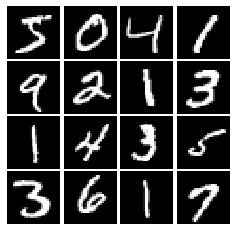

In [ ]:
# show a batch
mnist = MNIST(batch_size=16) 
show_images(mnist.X[:16])

## Section 1.1.3 Training code [15 pts]
### Training a GAN!

You can't train a model without a proper training code. Implement the GAN training procedure here following the [original GAN paper](https://arxiv.org/pdf/1406.2661.pdf) and the course slides in the cell below. Note that this code would be reused in the subsequent section, so make sure that it is correctly implemented.

In [ ]:
# a giant helper function
def train(D, G, D_solver, G_solver, discriminator_loss, generator_loss,\
              show_every=20, print_every=20, batch_size=128, num_epochs=10, noise_size=100):
    """
    Train loop for GAN.

    The loop will consist of two steps: a discriminator step and a generator step.

    (1) In the discriminator step, first step is to sample noise to generate a fake data batch using the generator. 
    Calculate the discriminator output for real and fake data, and use the output to compute discriminator loss. 
    In code 'd_total_error' is the total discriminator loss.
    
    (2) For the generator step, first step is to sample noise to generate a fake data batch. 
    Get the discriminator output for the fake data batch and use this to compute the generator loss. 
    In code 'g_error' is the generator loss. 
    
    Use the sample_noise function to sample random noise, and the discriminator_loss
    and generator_loss functions for their respective loss computations

    Inputs:
    - D: Discriminator model
    - G: Generator model
    - D_solver: an Optimizer for Discriminator
    - G_solver: an Optimizer for Generator
    - generator_loss: Generator loss
    - discriminator_loss: Discriminator loss
    Returns:
        Nothing
    """
    mnist = MNIST(batch_size=batch_size, shuffle=True)
    
    iter_count = 0
    for epoch in range(num_epochs):
        for (x, _) in mnist:
            with tf.GradientTape() as tape:
                real_data = x            
                ##########################################
                # your code   # Discriminator step       #
                fake_images = sample_noise(batch_size,noise_size)
                generated_data=G(fake_images)
                d_fake_data = D(generated_data)
                d_real_data = D(real_data)
                d_total_error=discriminator_loss(d_real_data,d_fake_data)
                ##########################################
                d_gradients = tape.gradient(d_total_error, D.trainable_variables)      
                D_solver.apply_gradients(zip(d_gradients, D.trainable_variables))
            
            with tf.GradientTape() as tape:
                ##########################################
                # your code # Generator step             #
                
                ##########################################
                fake_images= sample_noise(batch_size,noise_size)
                generated_data=G(fake_images)
                d_fake_data = D(generated_data)
                g_error = generator_loss(d_fake_data)
                g_gradients = tape.gradient(g_error, G.trainable_variables)      
                G_solver.apply_gradients(zip(g_gradients, G.trainable_variables))

            if (iter_count % show_every == 0):
                print('Epoch: {}, Iter: {}, D: {:.4}, G:{:.4}'.format(epoch, iter_count,d_total_error,g_error))
                imgs_numpy = fake_images.cpu().numpy()
                show_images(imgs_numpy[0:16])
                plt.show()
            iter_count += 1
    
    # random noise fed into our generator
    z = sample_noise(batch_size, noise_size)
    # generated images
    G_sample = G(z)
    print('Final images')
    show_images(G_sample[:16])
    plt.show()

### Section 1.1.4 Training on MNIST [5 pts]
#### Train your GAN!
Run the cell belowe to train your GAN model. You should expect results that resemble the following if your loss function and training loop implementations are correct:

Epoch: 0, Iter: 0, D: 1.462, G:0.7768


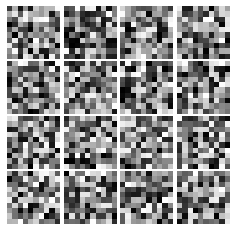

Epoch: 0, Iter: 20, D: 0.6228, G:0.8524


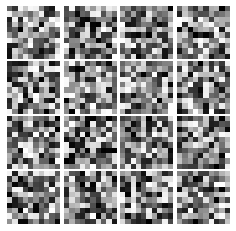

Epoch: 0, Iter: 40, D: 1.586, G:1.322


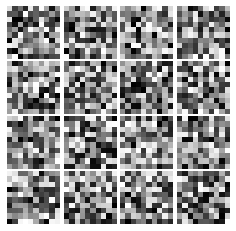

Epoch: 0, Iter: 60, D: 1.292, G:1.394


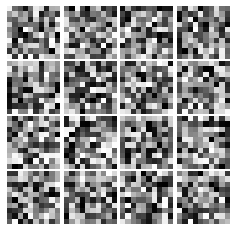

Epoch: 0, Iter: 80, D: 1.594, G:0.885


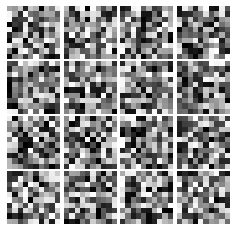

Epoch: 0, Iter: 100, D: 0.8853, G:1.248


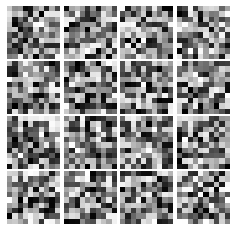

Epoch: 0, Iter: 120, D: 1.206, G:1.531


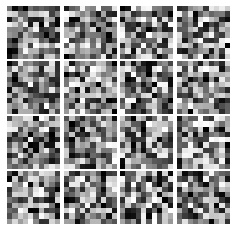

Epoch: 0, Iter: 140, D: 1.604, G:2.011


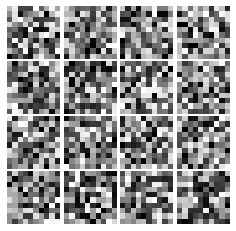

Epoch: 0, Iter: 160, D: 1.25, G:1.249


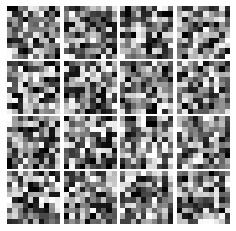

Epoch: 0, Iter: 180, D: 1.028, G:1.488


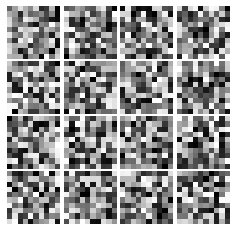

Epoch: 0, Iter: 200, D: 0.5975, G:1.828


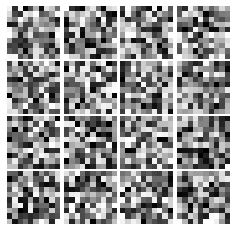

Epoch: 0, Iter: 220, D: 0.4432, G:2.341


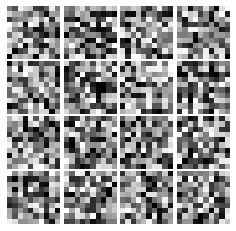

Epoch: 0, Iter: 240, D: 0.6429, G:2.254


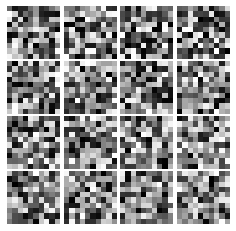

Epoch: 0, Iter: 260, D: 0.7664, G:2.919


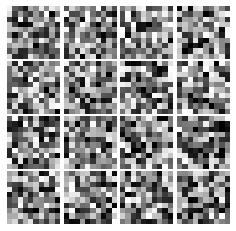

Epoch: 0, Iter: 280, D: 1.605, G:3.347


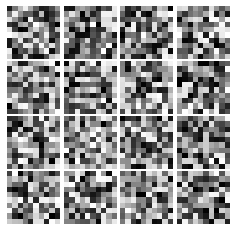

Epoch: 0, Iter: 300, D: 0.6973, G:2.691


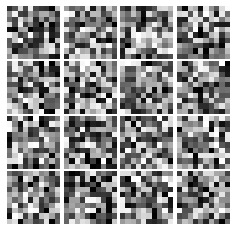

Epoch: 0, Iter: 320, D: 0.5729, G:2.923


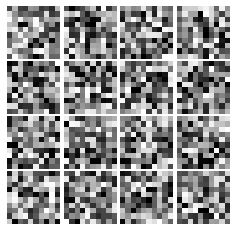

Epoch: 0, Iter: 340, D: 1.548, G:3.422


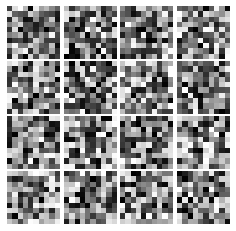

Epoch: 0, Iter: 360, D: 1.577, G:3.622


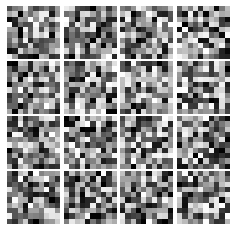

Epoch: 0, Iter: 380, D: 1.012, G:3.572


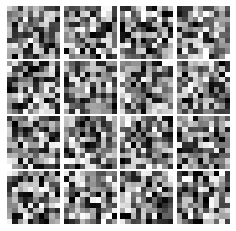

Epoch: 0, Iter: 400, D: 0.9399, G:2.66


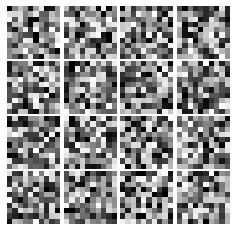

Epoch: 0, Iter: 420, D: 0.572, G:2.748


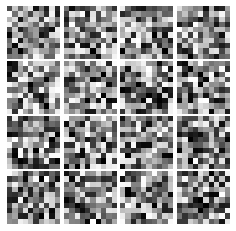

Epoch: 0, Iter: 440, D: 0.6484, G:3.055


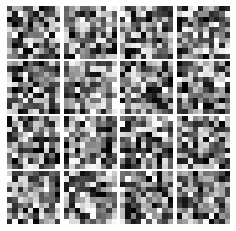

Epoch: 0, Iter: 460, D: 1.265, G:2.565


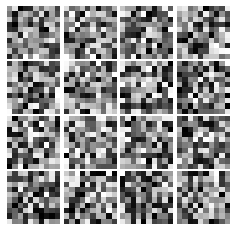

Epoch: 1, Iter: 480, D: 0.9229, G:3.243


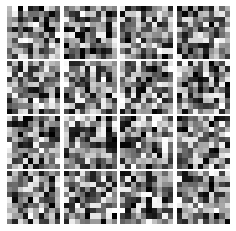

Epoch: 1, Iter: 500, D: 1.407, G:3.503


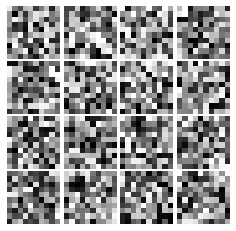

Epoch: 1, Iter: 520, D: 0.7241, G:2.712


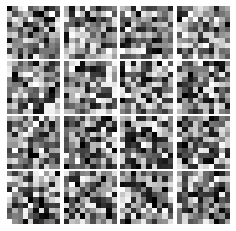

Epoch: 1, Iter: 540, D: 0.8845, G:3.247


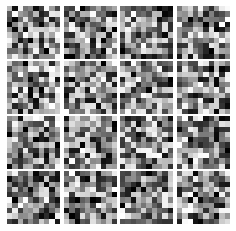

Epoch: 1, Iter: 560, D: 0.8314, G:3.018


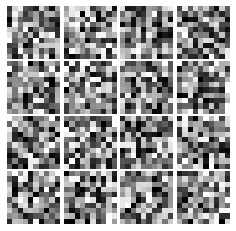

Epoch: 1, Iter: 580, D: 0.8115, G:2.607


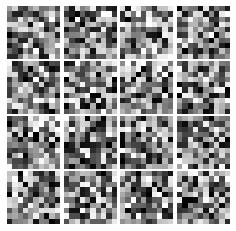

Epoch: 1, Iter: 600, D: 0.9084, G:2.588


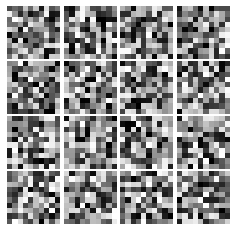

Epoch: 1, Iter: 620, D: 1.19, G:2.113


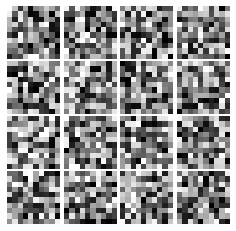

Epoch: 1, Iter: 640, D: 0.7611, G:3.095


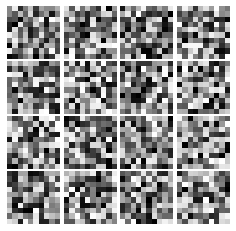

Epoch: 1, Iter: 660, D: 0.8407, G:3.925


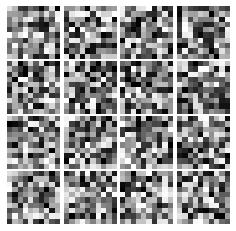

Epoch: 1, Iter: 680, D: 0.9591, G:3.187


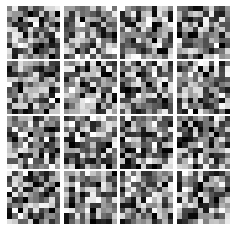

Epoch: 1, Iter: 700, D: 1.426, G:2.458


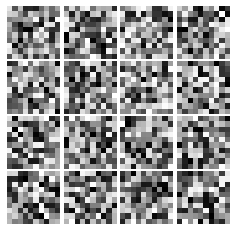

Epoch: 1, Iter: 720, D: 0.8796, G:2.717


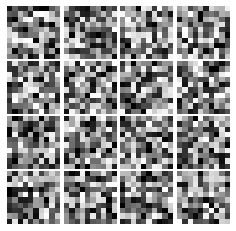

Epoch: 1, Iter: 740, D: 1.313, G:2.767


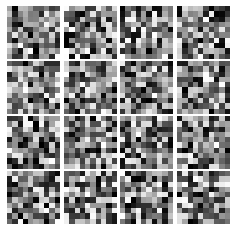

Epoch: 1, Iter: 760, D: 0.9764, G:2.65


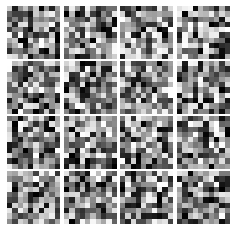

Epoch: 1, Iter: 780, D: 1.014, G:2.419


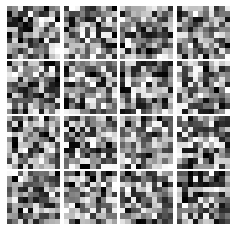

Epoch: 1, Iter: 800, D: 1.114, G:2.392


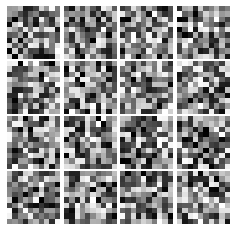

Epoch: 1, Iter: 820, D: 0.8399, G:2.602


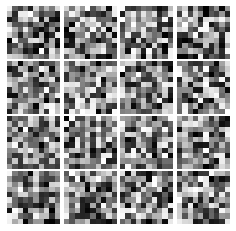

Epoch: 1, Iter: 840, D: 0.9446, G:2.109


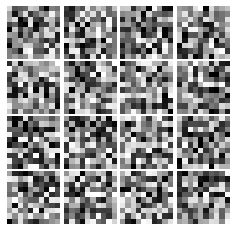

Epoch: 1, Iter: 860, D: 0.8649, G:3.098


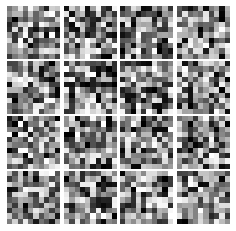

Epoch: 1, Iter: 880, D: 1.078, G:2.55


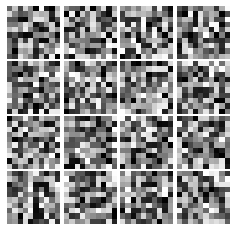

Epoch: 1, Iter: 900, D: 0.8976, G:2.423


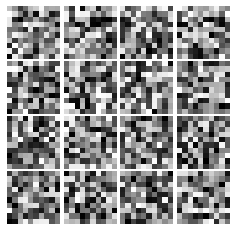

Epoch: 1, Iter: 920, D: 0.8236, G:3.109


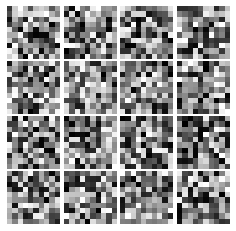

Epoch: 2, Iter: 940, D: 0.8609, G:2.194


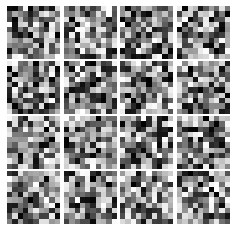

Epoch: 2, Iter: 960, D: 1.146, G:2.548


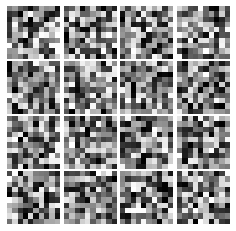

Epoch: 2, Iter: 980, D: 0.8547, G:2.47


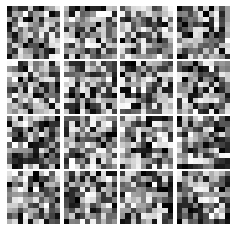

Epoch: 2, Iter: 1000, D: 1.112, G:2.11


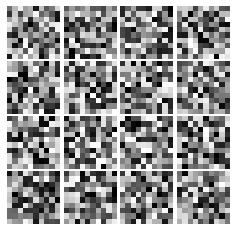

Epoch: 2, Iter: 1020, D: 1.13, G:1.811


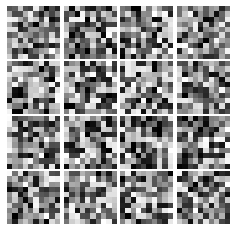

Epoch: 2, Iter: 1040, D: 1.178, G:1.987


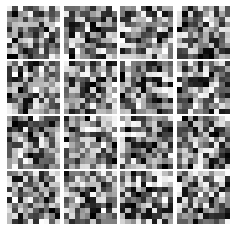

Epoch: 2, Iter: 1060, D: 1.301, G:1.629


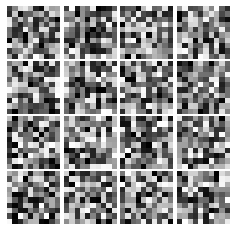

Epoch: 2, Iter: 1080, D: 1.067, G:1.802


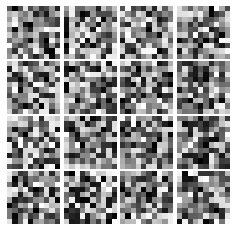

Epoch: 2, Iter: 1100, D: 0.9777, G:2.07


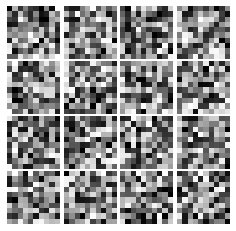

Epoch: 2, Iter: 1120, D: 1.127, G:2.041


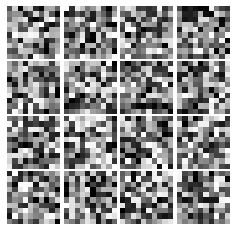

Epoch: 2, Iter: 1140, D: 1.006, G:1.741


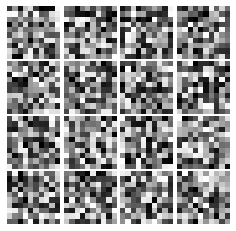

Epoch: 2, Iter: 1160, D: 0.8878, G:1.754


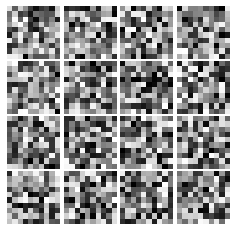

Epoch: 2, Iter: 1180, D: 0.9704, G:1.72


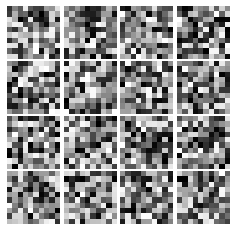

Epoch: 2, Iter: 1200, D: 1.037, G:1.702


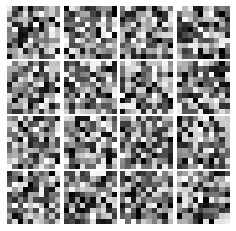

Epoch: 2, Iter: 1220, D: 1.141, G:1.546


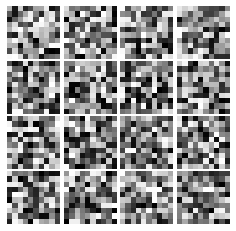

Epoch: 2, Iter: 1240, D: 1.008, G:1.686


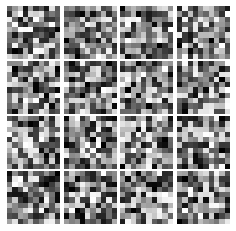

Epoch: 2, Iter: 1260, D: 1.881, G:1.326


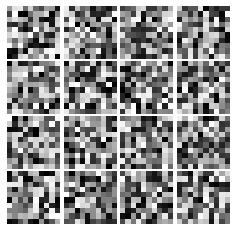

Epoch: 2, Iter: 1280, D: 1.065, G:1.334


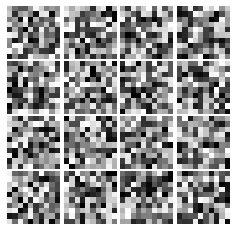

Epoch: 2, Iter: 1300, D: 1.005, G:1.428


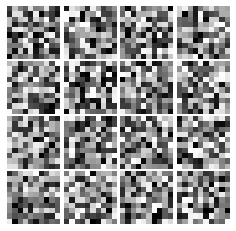

Epoch: 2, Iter: 1320, D: 1.217, G:1.633


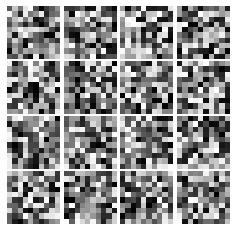

Epoch: 2, Iter: 1340, D: 1.306, G:1.438


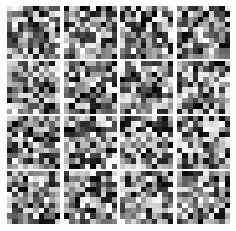

Epoch: 2, Iter: 1360, D: 1.058, G:1.4


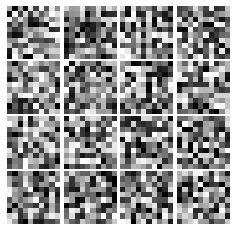

Epoch: 2, Iter: 1380, D: 1.213, G:1.678


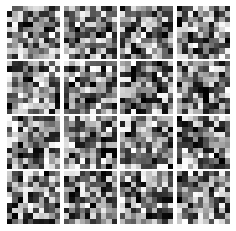

Epoch: 2, Iter: 1400, D: 1.084, G:1.417


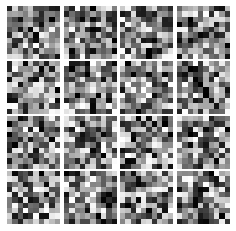

Epoch: 3, Iter: 1420, D: 1.087, G:1.701


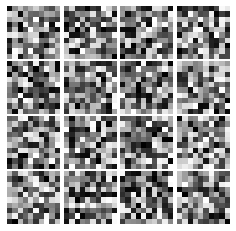

Epoch: 3, Iter: 1440, D: 0.9816, G:1.694


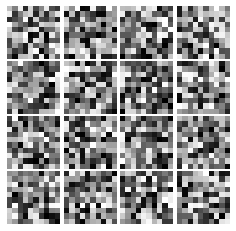

Epoch: 3, Iter: 1460, D: 1.017, G:1.463


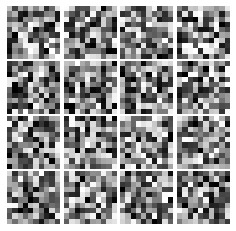

Epoch: 3, Iter: 1480, D: 1.213, G:1.666


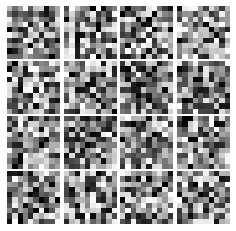

Epoch: 3, Iter: 1500, D: 1.106, G:1.296


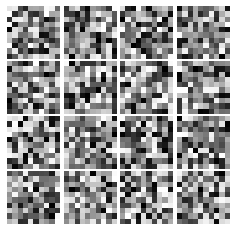

Epoch: 3, Iter: 1520, D: 1.296, G:1.437


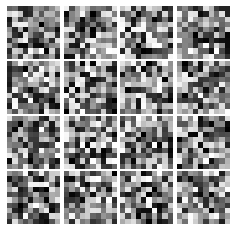

Epoch: 3, Iter: 1540, D: 1.246, G:1.306


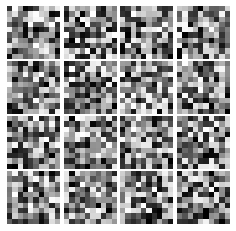

Epoch: 3, Iter: 1560, D: 1.068, G:1.294


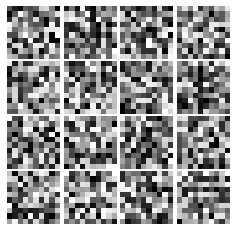

Epoch: 3, Iter: 1580, D: 0.973, G:1.7


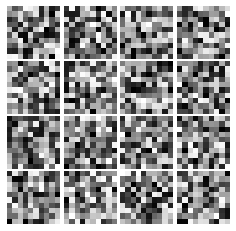

Epoch: 3, Iter: 1600, D: 1.054, G:1.496


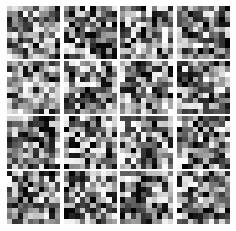

Epoch: 3, Iter: 1620, D: 0.9455, G:1.362


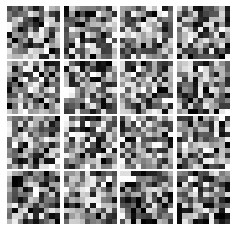

Epoch: 3, Iter: 1640, D: 1.016, G:1.765


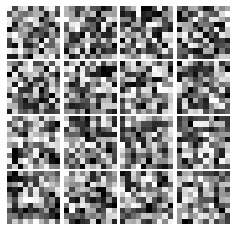

Epoch: 3, Iter: 1660, D: 1.135, G:1.52


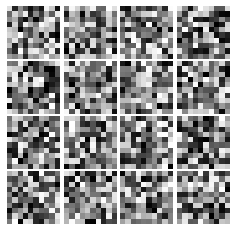

Epoch: 3, Iter: 1680, D: 0.9723, G:1.423


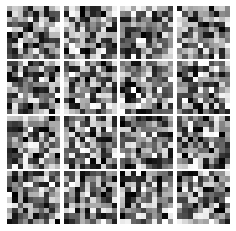

Epoch: 3, Iter: 1700, D: 1.071, G:1.964


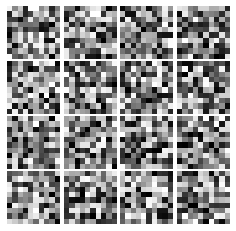

Epoch: 3, Iter: 1720, D: 1.1, G:1.86


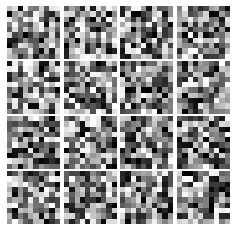

Epoch: 3, Iter: 1740, D: 1.134, G:1.193


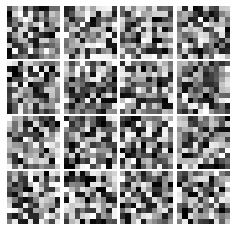

Epoch: 3, Iter: 1760, D: 0.9773, G:2.296


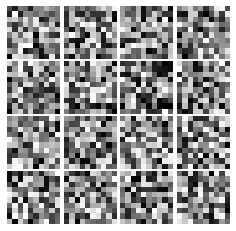

Epoch: 3, Iter: 1780, D: 1.032, G:1.569


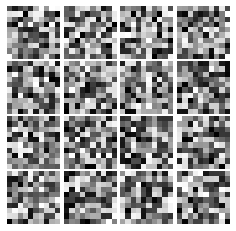

Epoch: 3, Iter: 1800, D: 1.35, G:1.265


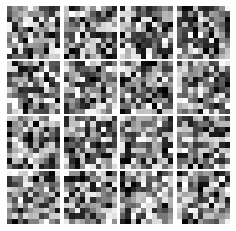

Epoch: 3, Iter: 1820, D: 1.198, G:1.367


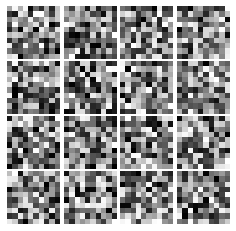

Epoch: 3, Iter: 1840, D: 1.083, G:1.578


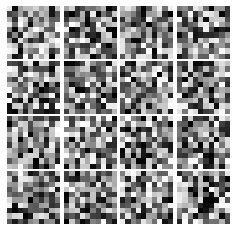

Epoch: 3, Iter: 1860, D: 1.078, G:1.397


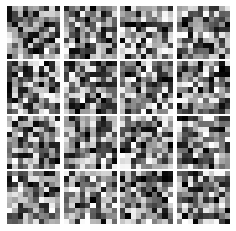

Epoch: 4, Iter: 1880, D: 1.084, G:1.459


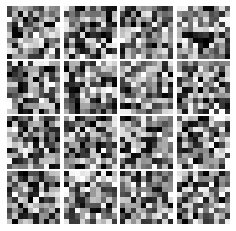

Epoch: 4, Iter: 1900, D: 0.9344, G:1.312


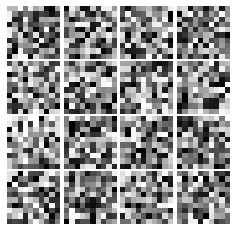

Epoch: 4, Iter: 1920, D: 0.9193, G:1.497


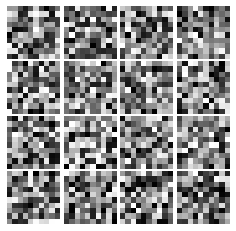

Epoch: 4, Iter: 1940, D: 1.067, G:1.81


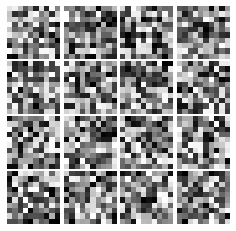

Epoch: 4, Iter: 1960, D: 1.034, G:1.546


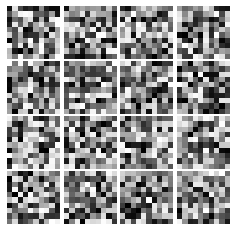

Epoch: 4, Iter: 1980, D: 1.065, G:1.668


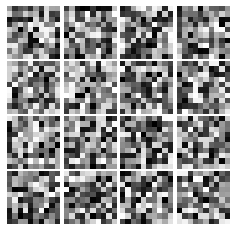

Epoch: 4, Iter: 2000, D: 0.8617, G:1.576


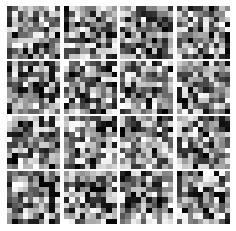

Epoch: 4, Iter: 2020, D: 1.277, G:1.476


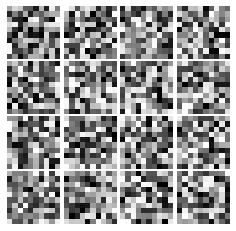

Epoch: 4, Iter: 2040, D: 1.058, G:1.456


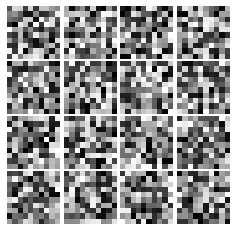

Epoch: 4, Iter: 2060, D: 1.367, G:1.167


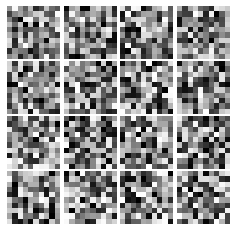

Epoch: 4, Iter: 2080, D: 0.9119, G:1.442


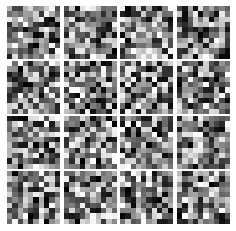

Epoch: 4, Iter: 2100, D: 1.014, G:1.369


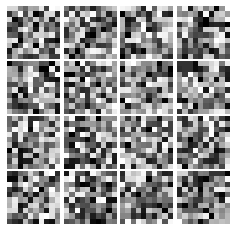

Epoch: 4, Iter: 2120, D: 1.077, G:1.238


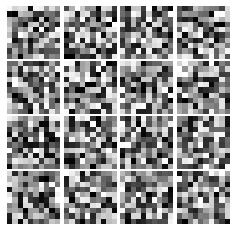

Epoch: 4, Iter: 2140, D: 1.158, G:1.729


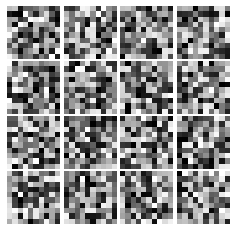

Epoch: 4, Iter: 2160, D: 0.9692, G:1.516


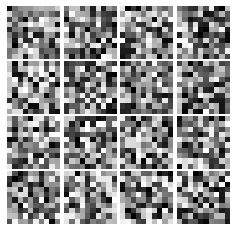

Epoch: 4, Iter: 2180, D: 1.042, G:1.567


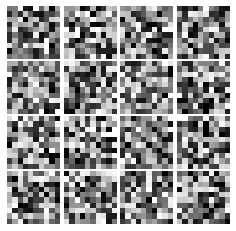

Epoch: 4, Iter: 2200, D: 0.8657, G:1.643


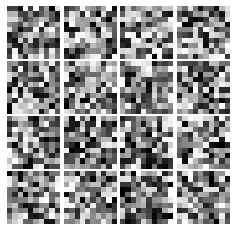

Epoch: 4, Iter: 2220, D: 1.113, G:1.386


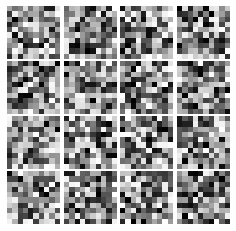

Epoch: 4, Iter: 2240, D: 1.159, G:1.459


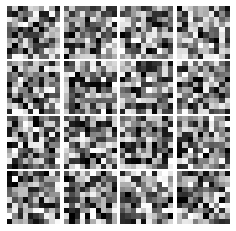

Epoch: 4, Iter: 2260, D: 0.9895, G:1.591


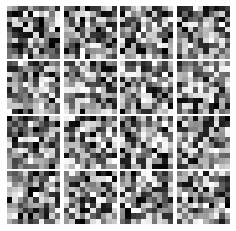

Epoch: 4, Iter: 2280, D: 1.043, G:1.508


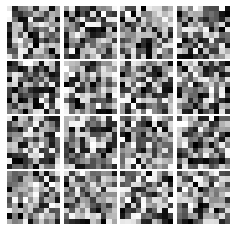

Epoch: 4, Iter: 2300, D: 1.06, G:1.4


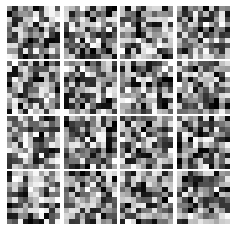

Epoch: 4, Iter: 2320, D: 0.9392, G:1.54


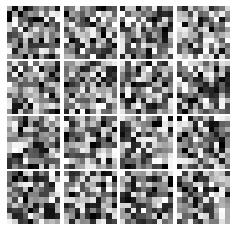

Epoch: 4, Iter: 2340, D: 1.088, G:1.353


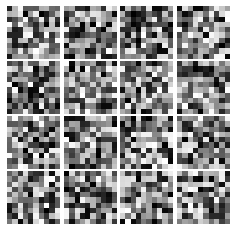

Epoch: 5, Iter: 2360, D: 1.022, G:1.266


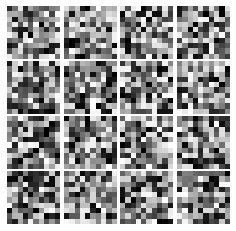

Epoch: 5, Iter: 2380, D: 1.031, G:1.589


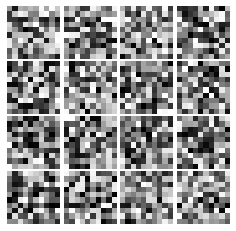

Epoch: 5, Iter: 2400, D: 0.9889, G:1.406


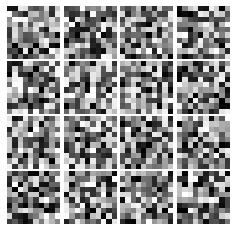

Epoch: 5, Iter: 2420, D: 1.027, G:1.604


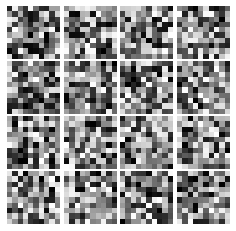

Epoch: 5, Iter: 2440, D: 0.9083, G:1.651


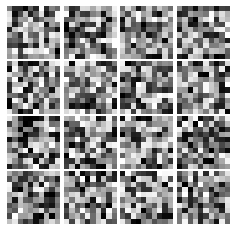

Epoch: 5, Iter: 2460, D: 0.9539, G:2.073


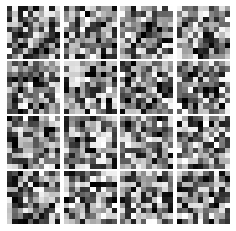

Epoch: 5, Iter: 2480, D: 0.9397, G:1.497


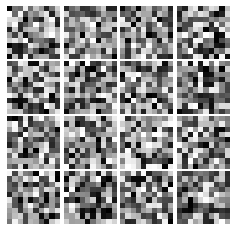

Epoch: 5, Iter: 2500, D: 0.9555, G:2.05


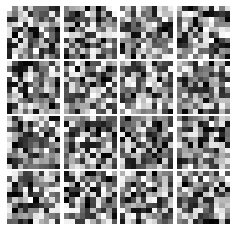

Epoch: 5, Iter: 2520, D: 0.9196, G:1.371


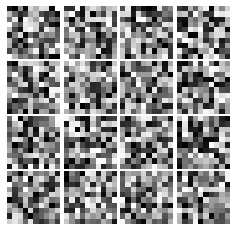

Epoch: 5, Iter: 2540, D: 1.06, G:1.885


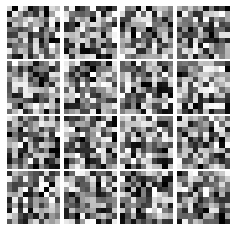

Epoch: 5, Iter: 2560, D: 0.8954, G:1.672


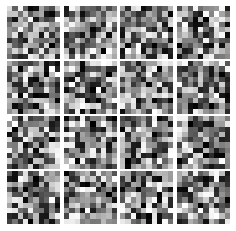

Epoch: 5, Iter: 2580, D: 1.05, G:1.738


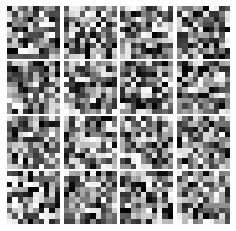

Epoch: 5, Iter: 2600, D: 1.076, G:1.372


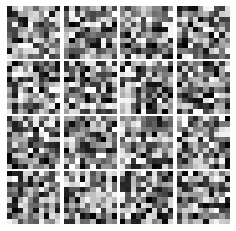

Epoch: 5, Iter: 2620, D: 0.9667, G:1.861


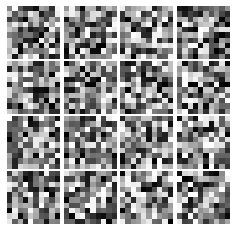

Epoch: 5, Iter: 2640, D: 1.005, G:1.419


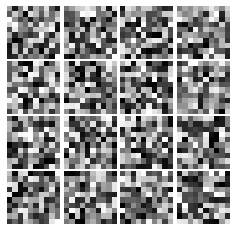

Epoch: 5, Iter: 2660, D: 0.9105, G:1.686


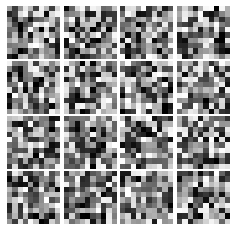

Epoch: 5, Iter: 2680, D: 0.9893, G:1.451


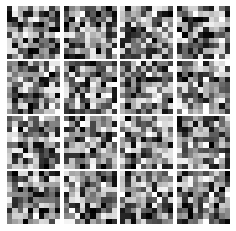

Epoch: 5, Iter: 2700, D: 1.022, G:1.561


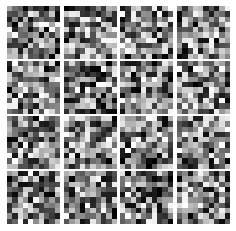

Epoch: 5, Iter: 2720, D: 0.9917, G:1.692


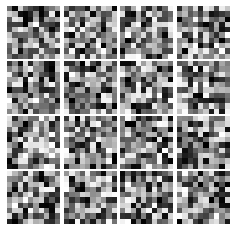

Epoch: 5, Iter: 2740, D: 0.9534, G:1.947


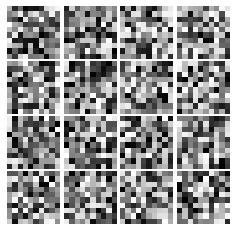

Epoch: 5, Iter: 2760, D: 0.9673, G:2.142


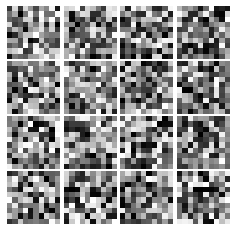

Epoch: 5, Iter: 2780, D: 0.8764, G:1.647


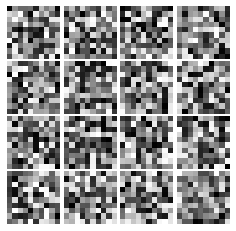

Epoch: 5, Iter: 2800, D: 1.014, G:1.721


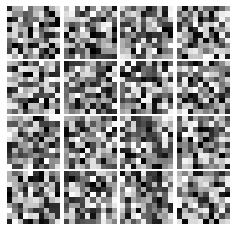

Epoch: 6, Iter: 2820, D: 0.962, G:1.585


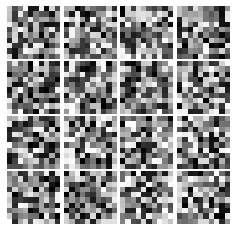

Epoch: 6, Iter: 2840, D: 0.9503, G:1.806


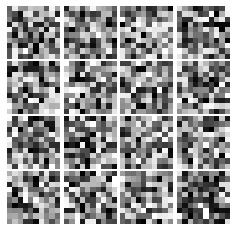

Epoch: 6, Iter: 2860, D: 0.944, G:1.607


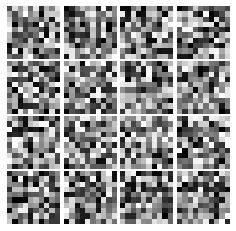

Epoch: 6, Iter: 2880, D: 1.073, G:1.213


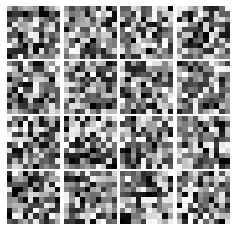

Epoch: 6, Iter: 2900, D: 0.9435, G:1.541


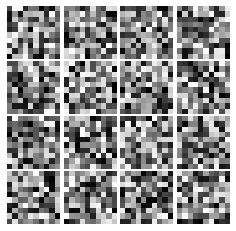

Epoch: 6, Iter: 2920, D: 1.094, G:1.877


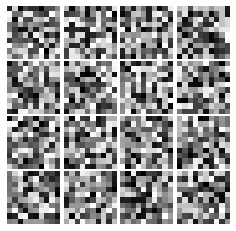

Epoch: 6, Iter: 2940, D: 1.005, G:1.548


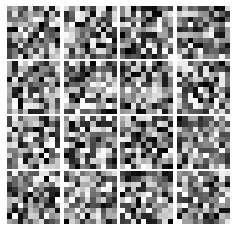

Epoch: 6, Iter: 2960, D: 0.9566, G:1.851


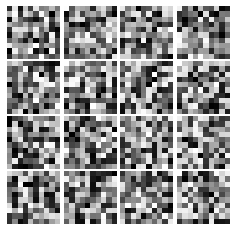

Epoch: 6, Iter: 2980, D: 0.9241, G:1.539


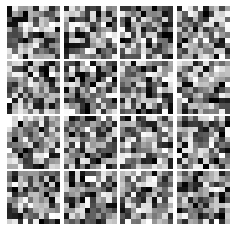

Epoch: 6, Iter: 3000, D: 0.8788, G:1.732


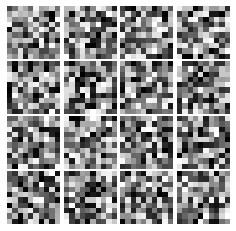

Epoch: 6, Iter: 3020, D: 0.8524, G:1.822


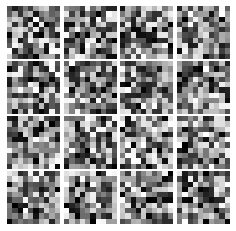

Epoch: 6, Iter: 3040, D: 0.8368, G:1.896


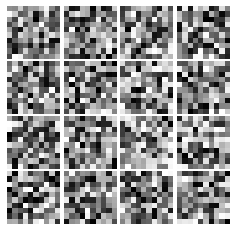

Epoch: 6, Iter: 3060, D: 0.9333, G:1.549


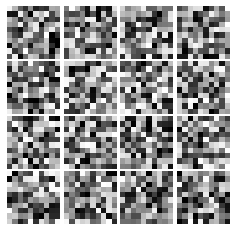

Epoch: 6, Iter: 3080, D: 0.8576, G:1.968


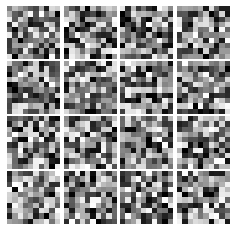

Epoch: 6, Iter: 3100, D: 0.9941, G:1.428


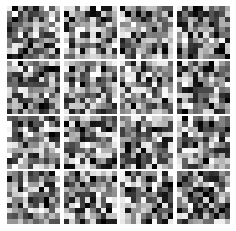

Epoch: 6, Iter: 3120, D: 0.8078, G:1.923


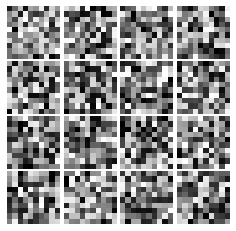

Epoch: 6, Iter: 3140, D: 0.9933, G:1.714


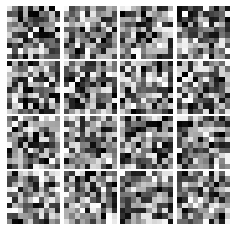

Epoch: 6, Iter: 3160, D: 0.8895, G:1.816


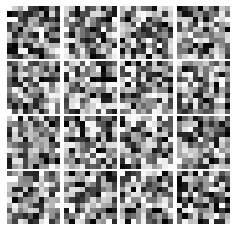

Epoch: 6, Iter: 3180, D: 0.904, G:1.621


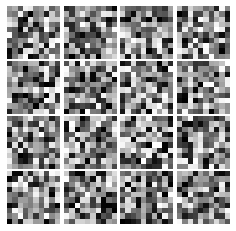

Epoch: 6, Iter: 3200, D: 0.7431, G:1.785


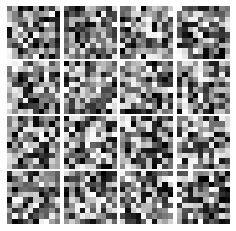

Epoch: 6, Iter: 3220, D: 0.9919, G:1.764


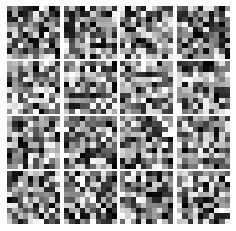

Epoch: 6, Iter: 3240, D: 0.7956, G:1.884


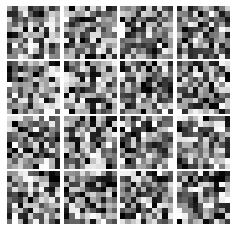

Epoch: 6, Iter: 3260, D: 0.8722, G:1.634


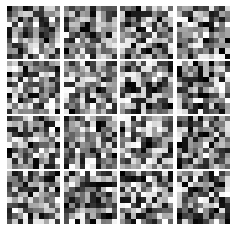

Epoch: 6, Iter: 3280, D: 0.9421, G:1.9


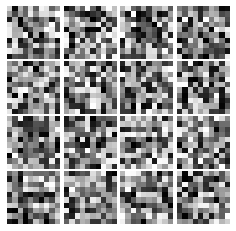

Epoch: 7, Iter: 3300, D: 0.8445, G:1.965


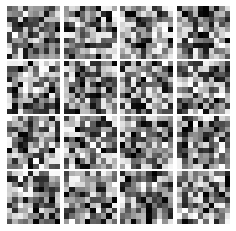

Epoch: 7, Iter: 3320, D: 0.8258, G:2.089


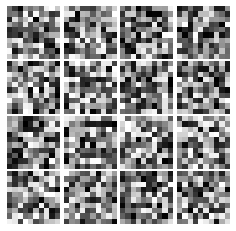

Epoch: 7, Iter: 3340, D: 1.011, G:1.672


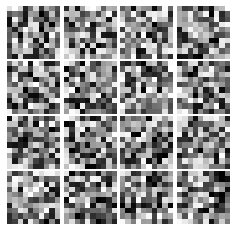

Epoch: 7, Iter: 3360, D: 0.9673, G:2.175


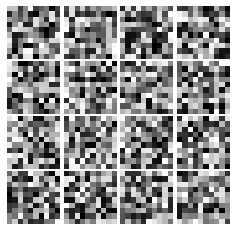

Epoch: 7, Iter: 3380, D: 1.078, G:1.766


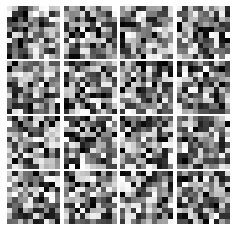

Epoch: 7, Iter: 3400, D: 0.7969, G:2.102


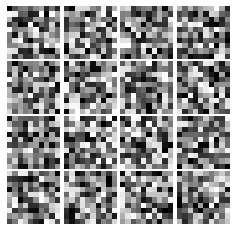

Epoch: 7, Iter: 3420, D: 0.939, G:2.019


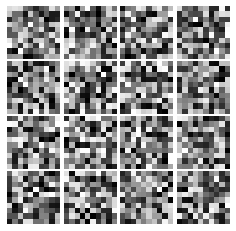

Epoch: 7, Iter: 3440, D: 0.8712, G:1.842


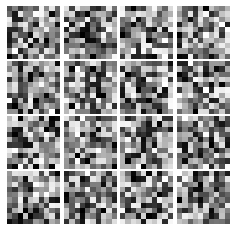

Epoch: 7, Iter: 3460, D: 0.9843, G:1.367


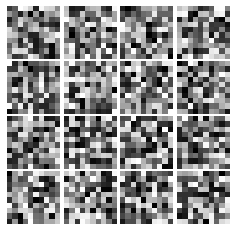

Epoch: 7, Iter: 3480, D: 0.966, G:1.87


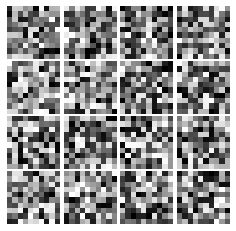

Epoch: 7, Iter: 3500, D: 0.9188, G:1.983


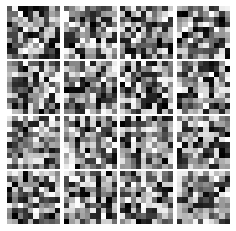

Epoch: 7, Iter: 3520, D: 0.9217, G:2.119


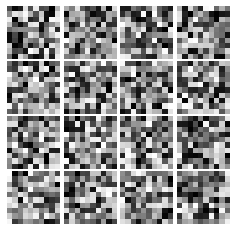

Epoch: 7, Iter: 3540, D: 0.9397, G:1.967


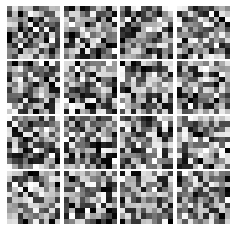

Epoch: 7, Iter: 3560, D: 0.6963, G:1.826


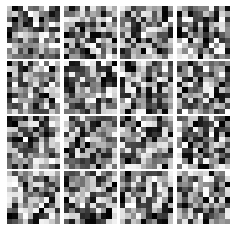

Epoch: 7, Iter: 3580, D: 0.7502, G:1.971


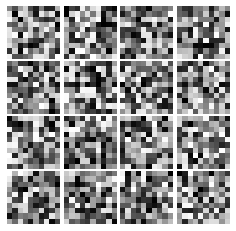

Epoch: 7, Iter: 3600, D: 0.8069, G:1.998


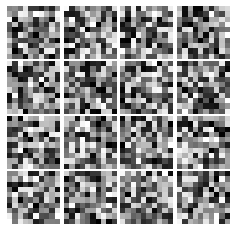

Epoch: 7, Iter: 3620, D: 0.9297, G:1.742


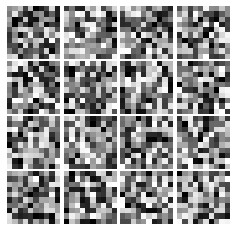

Epoch: 7, Iter: 3640, D: 0.9591, G:1.751


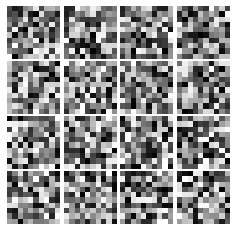

Epoch: 7, Iter: 3660, D: 0.7547, G:2.118


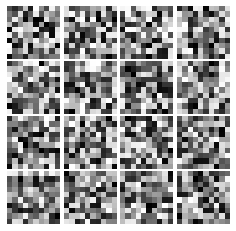

Epoch: 7, Iter: 3680, D: 0.7231, G:1.93


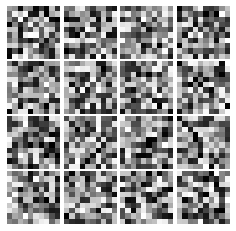

Epoch: 7, Iter: 3700, D: 0.8406, G:1.962


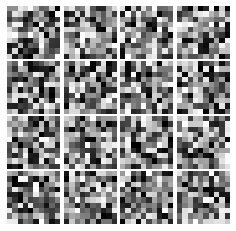

Epoch: 7, Iter: 3720, D: 0.8096, G:1.898


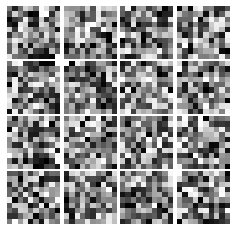

Epoch: 7, Iter: 3740, D: 0.9563, G:1.987


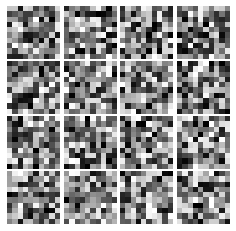

Epoch: 8, Iter: 3760, D: 0.8717, G:1.868


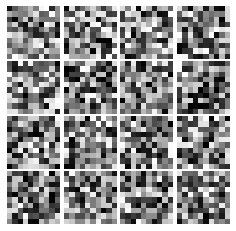

Epoch: 8, Iter: 3780, D: 0.926, G:2.139


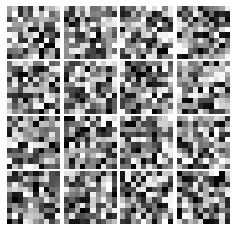

Epoch: 8, Iter: 3800, D: 0.8544, G:2.201


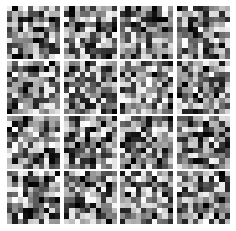

Epoch: 8, Iter: 3820, D: 0.7628, G:1.973


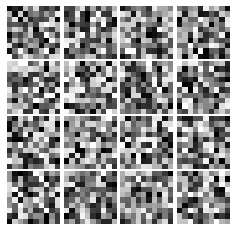

Epoch: 8, Iter: 3840, D: 0.7432, G:2.025


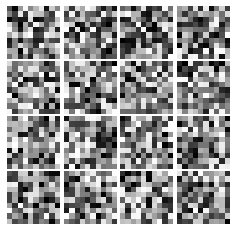

Epoch: 8, Iter: 3860, D: 0.744, G:2.271


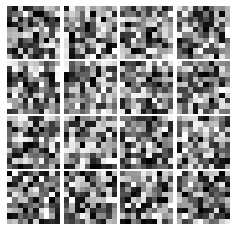

Epoch: 8, Iter: 3880, D: 0.8795, G:2.518


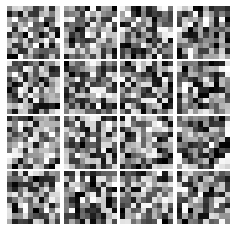

Epoch: 8, Iter: 3900, D: 0.7961, G:1.886


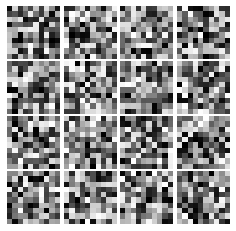

Epoch: 8, Iter: 3920, D: 0.8206, G:2.075


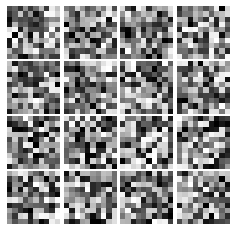

Epoch: 8, Iter: 3940, D: 0.7301, G:2.32


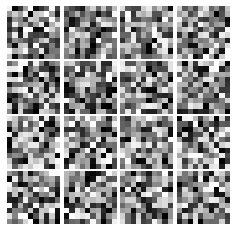

Epoch: 8, Iter: 3960, D: 0.8584, G:1.83


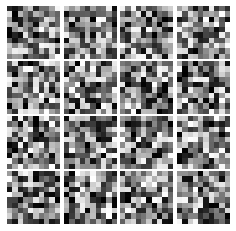

Epoch: 8, Iter: 3980, D: 0.8332, G:2.269


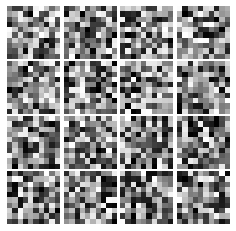

Epoch: 8, Iter: 4000, D: 0.724, G:1.827


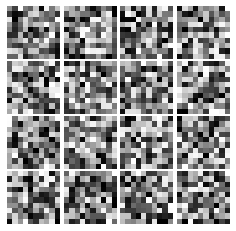

Epoch: 8, Iter: 4020, D: 0.7948, G:1.759


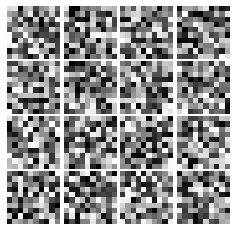

Epoch: 8, Iter: 4040, D: 0.7983, G:2.688


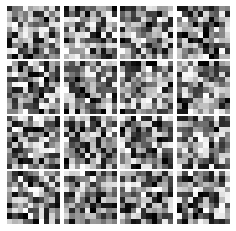

Epoch: 8, Iter: 4060, D: 0.6806, G:1.905


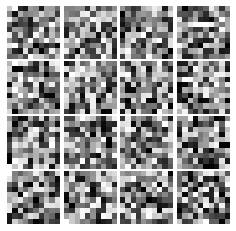

Epoch: 8, Iter: 4080, D: 0.9334, G:1.874


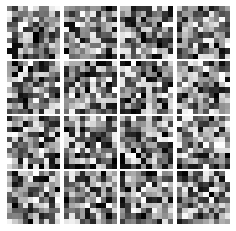

Epoch: 8, Iter: 4100, D: 0.8484, G:2.262


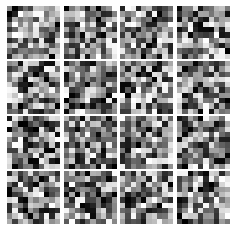

Epoch: 8, Iter: 4120, D: 0.7465, G:2.369


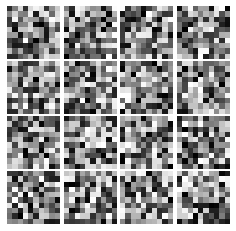

Epoch: 8, Iter: 4140, D: 0.7321, G:1.783


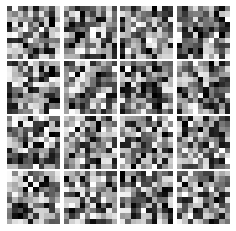

Epoch: 8, Iter: 4160, D: 0.7581, G:1.958


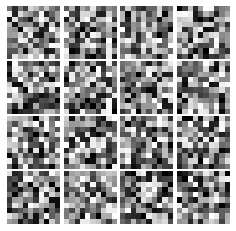

Epoch: 8, Iter: 4180, D: 0.9065, G:2.38


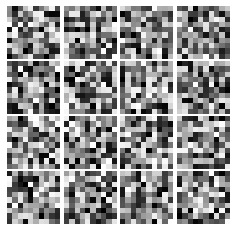

Epoch: 8, Iter: 4200, D: 0.6175, G:2.356


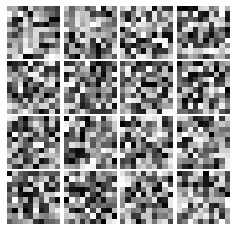

Epoch: 8, Iter: 4220, D: 0.6627, G:3.459


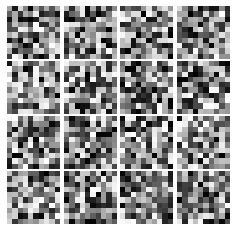

Epoch: 9, Iter: 4240, D: 0.7852, G:2.238


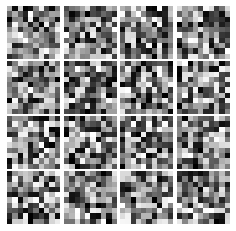

Epoch: 9, Iter: 4260, D: 0.8139, G:1.869


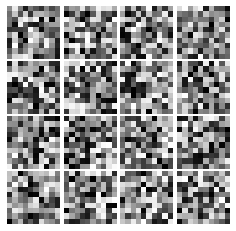

Epoch: 9, Iter: 4280, D: 0.6634, G:1.84


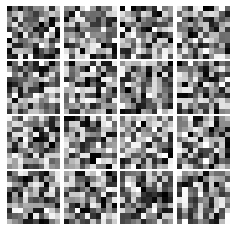

Epoch: 9, Iter: 4300, D: 0.9161, G:1.728


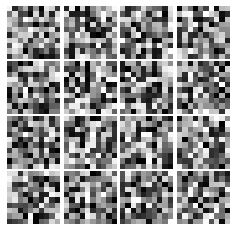

Epoch: 9, Iter: 4320, D: 0.7726, G:2.589


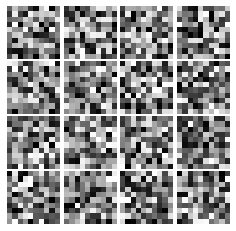

Epoch: 9, Iter: 4340, D: 0.7987, G:2.009


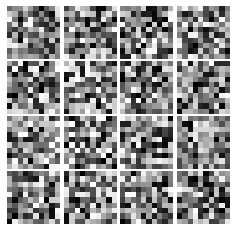

Epoch: 9, Iter: 4360, D: 0.7472, G:2.525


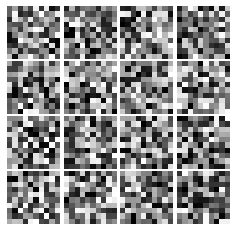

Epoch: 9, Iter: 4380, D: 0.7919, G:2.467


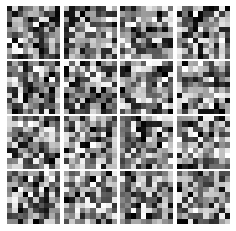

Epoch: 9, Iter: 4400, D: 0.7274, G:2.14


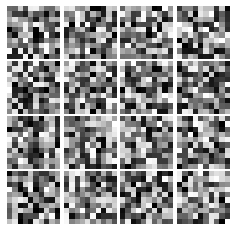

Epoch: 9, Iter: 4420, D: 0.7558, G:1.707


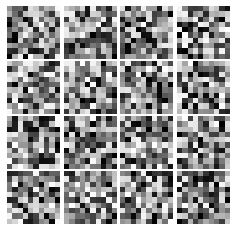

Epoch: 9, Iter: 4440, D: 0.795, G:2.056


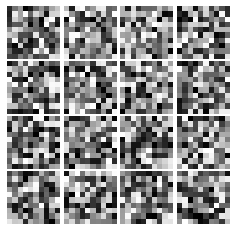

Epoch: 9, Iter: 4460, D: 0.7893, G:2.344


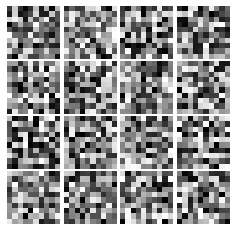

Epoch: 9, Iter: 4480, D: 0.7192, G:2.009


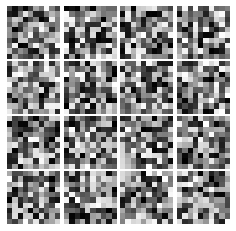

Epoch: 9, Iter: 4500, D: 0.7784, G:1.758


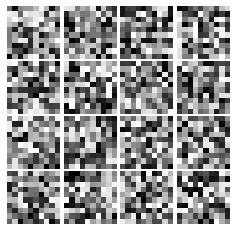

Epoch: 9, Iter: 4520, D: 0.769, G:2.261


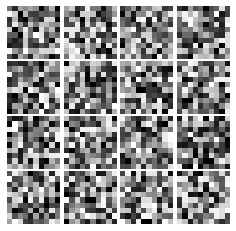

Epoch: 9, Iter: 4540, D: 0.6975, G:2.151


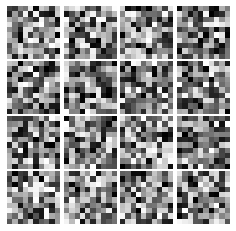

Epoch: 9, Iter: 4560, D: 0.7524, G:2.008


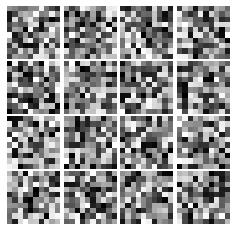

Epoch: 9, Iter: 4580, D: 0.8405, G:1.955


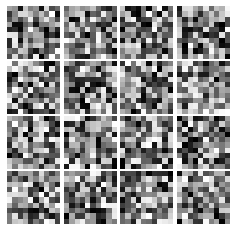

Epoch: 9, Iter: 4600, D: 0.7208, G:1.954


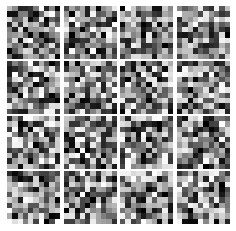

Epoch: 9, Iter: 4620, D: 0.8468, G:1.755


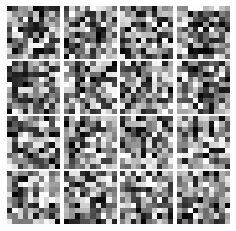

Epoch: 9, Iter: 4640, D: 0.8018, G:2.03


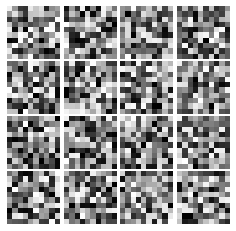

Epoch: 9, Iter: 4660, D: 0.7544, G:1.987


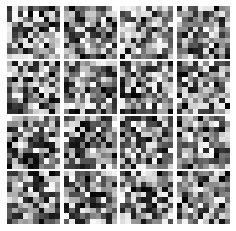

Epoch: 9, Iter: 4680, D: 0.8846, G:1.708


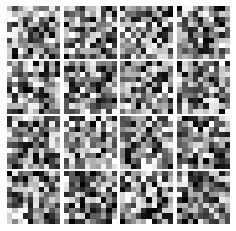

Final images


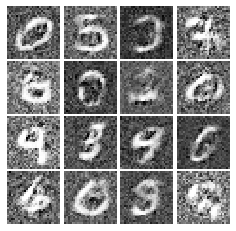

In [ ]:
D = discriminator()
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver = tf.keras.optimizers.Adam(learning_rate=1e-3, beta_1=0.5, beta_2=0.999)
G_solver = tf.keras.optimizers.Adam(learning_rate=1e-3, beta_1=0.5, beta_2=0.999)
    
# Run it!
train(D, G, D_solver, G_solver, discriminator_loss, generator_loss)

Well that wasn't so hard, was it? After the first epoch, you should see fuzzy outlines, clear shapes as you approach epoch 3, and decent shapes, about half of which will be sharp and clearly recognizable as we pass epoch 5. In our case, we'll simply train D(x) and G(z) with one batch each every iteration. However, papers often experiment with different schedules of training D(x) and G(z), sometimes doing one for more steps than the other, or even training each one until the loss gets "good enough" and then switching to training the other. 

## Section 1.2 Least-square GAN Loss
### Section 1.2.1 LSGAN Loss [10 pts]
We'll now look at [Least Squares GAN](https://arxiv.org/abs/1611.04076), a newer, more stable alernative to the original GAN loss function. For this part, all we have to do is change the loss function and retrain the model. We'll implement equation (9) in the paper, with the generator loss:
$$\ell_G  =  \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[\left(D(G(z))-1\right)^2\right]$$
and the discriminator loss:
$$ \ell_D = \frac{1}{2}\mathbb{E}_{x \sim p_\text{data}}\left[\left(D(x)-1\right)^2\right] + \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[ \left(D(G(z))\right)^2\right]$$
Fill in the `ls_discriminator_loss` and `ls_generator_loss` in the cell below.

**HINTS**: Instead of computing the expectation, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing. When plugging in for $D(x)$ and $D(G(z))$ use the direct output from the discriminator (`scores_real` and `scores_fake`).

In [ ]:
def ls_discriminator_loss(logits_real, logits_fake):
    """
    Compute the Least-Squares GAN loss for the discriminator.

    Inputs:
    - logits_real: Tensor of shape (N,) giving scores for the real data.
    - logits_fake: Tensor of shape (N,) giving scores for the fake data.
    - N is the Batch size
 
    Outputs:
    - loss: A Tensor containing the loss.
    """
 
    loss = None
    loss = 0.5 * tf.reduce_mean(tf.square(logits_real - 1)) + 0.5 * tf.reduce_mean(tf.square(logits_fake))
    ####################################
    # your code here. 
    ####################################

    ##########       END      ##########
    return loss

def ls_generator_loss(logits_fake):
    """
    Computes the Least-Squares GAN loss for the generator.
 
    Inputs:
    - logits_fake: TensorFlow Tensor of shape (N,) giving scores for the fake data.
 
    Outputs:
    - loss: A TensorFlow Tensor containing the loss.
    """
    loss=None
    loss = 0.5 * tf.reduce_mean(tf.square(logits_fake - 1))
 
    ####################################
    #          YOUR CODE HERE          #
    ####################################
    
    ##########       END      ##########
    return loss    

### Section 1.2.2 Train LSGAN [5 pts]
Similarly, train your LSGAN on MNIST dataset. You should expect results that resemble the following if your loss function and training loop implementations are correct:

<img src="files/gan_samples/mnist_ls.jpg" width=300>

Epoch: 0, Iter: 0, D: 0.2811, G:0.4591
Instructions for updating:
Use tf.identity instead.


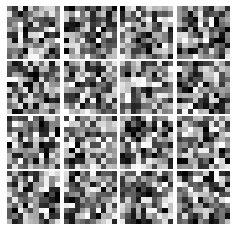

Epoch: 0, Iter: 20, D: 0.02397, G:0.6022


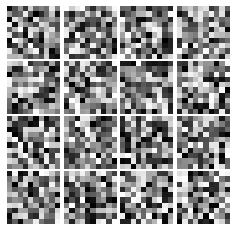

Epoch: 0, Iter: 40, D: 0.02459, G:0.7825


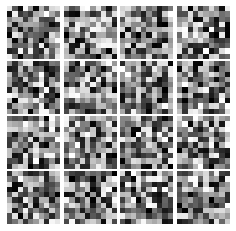

Epoch: 0, Iter: 60, D: 0.03664, G:0.7205


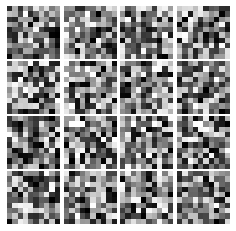

Epoch: 0, Iter: 80, D: 0.06847, G:0.8861


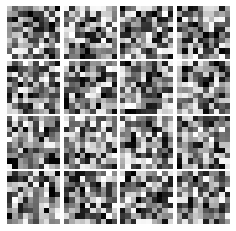

Epoch: 0, Iter: 100, D: 0.0345, G:0.6977


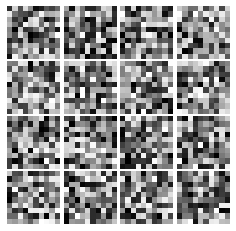

Epoch: 0, Iter: 120, D: 0.05651, G:0.8877


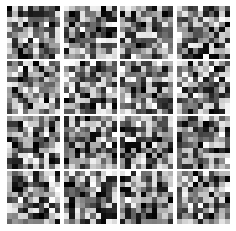

Epoch: 0, Iter: 140, D: 0.07169, G:0.766


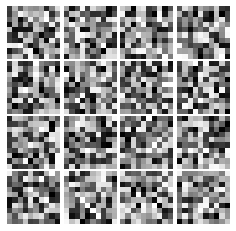

Epoch: 0, Iter: 160, D: 0.08643, G:0.6146


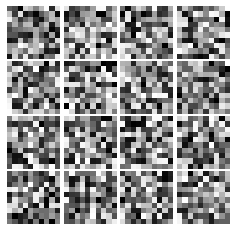

Epoch: 0, Iter: 180, D: 0.05121, G:0.6793


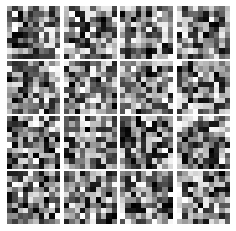

Epoch: 0, Iter: 200, D: 0.1108, G:0.9334


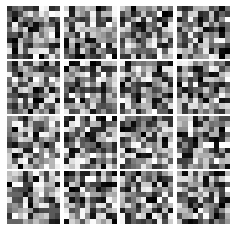

Epoch: 0, Iter: 220, D: 0.12, G:0.6067


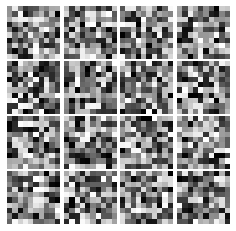

Epoch: 0, Iter: 240, D: 0.06015, G:0.7327


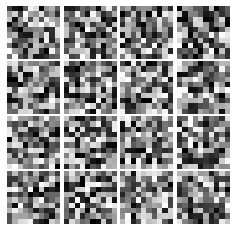

Epoch: 0, Iter: 260, D: 0.047, G:0.5802


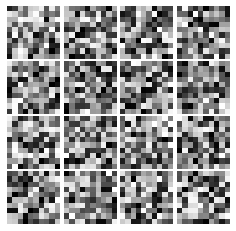

Epoch: 0, Iter: 280, D: 0.2126, G:0.7801


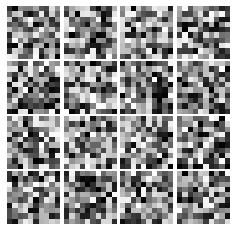

Epoch: 0, Iter: 300, D: 0.123, G:1.033


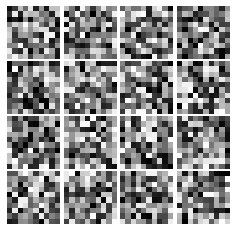

Epoch: 0, Iter: 320, D: 0.09792, G:0.5381


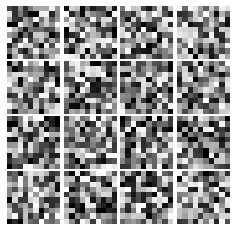

Epoch: 0, Iter: 340, D: 0.04425, G:0.7492


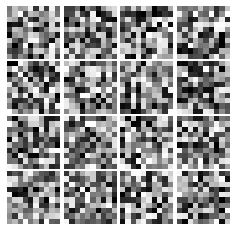

Epoch: 0, Iter: 360, D: 0.08564, G:0.6232


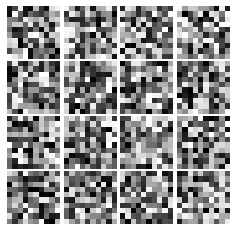

Epoch: 0, Iter: 380, D: 0.1796, G:1.251


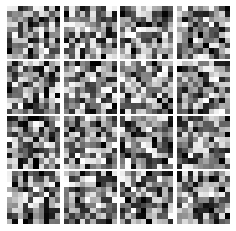

Epoch: 0, Iter: 400, D: 0.1216, G:0.6999


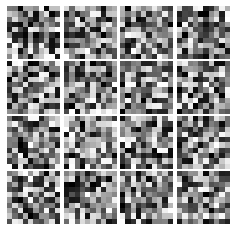

Epoch: 0, Iter: 420, D: 0.1097, G:0.8792


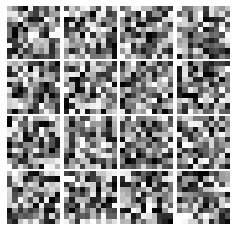

Epoch: 0, Iter: 440, D: 0.1472, G:0.822


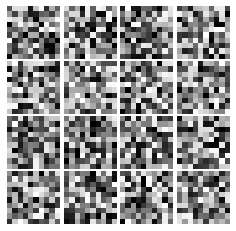

Epoch: 0, Iter: 460, D: 0.09992, G:0.6076


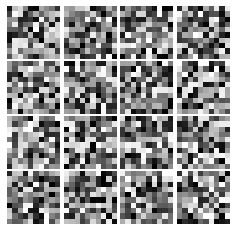

Epoch: 1, Iter: 480, D: 0.1381, G:0.5509


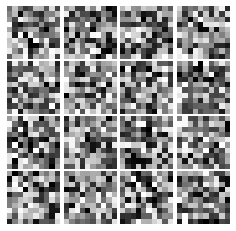

Epoch: 1, Iter: 500, D: 0.1543, G:0.7173


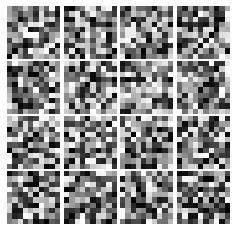

Epoch: 1, Iter: 520, D: 0.1456, G:0.4709


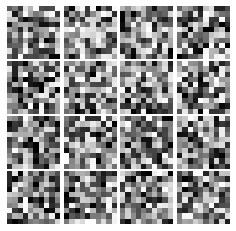

Epoch: 1, Iter: 540, D: 0.127, G:0.5334


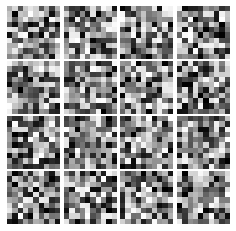

Epoch: 1, Iter: 560, D: 0.1823, G:0.4523


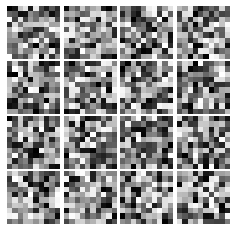

Epoch: 1, Iter: 580, D: 0.2494, G:0.6472


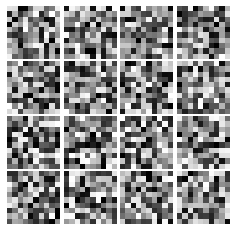

Epoch: 1, Iter: 600, D: 0.2492, G:0.4213


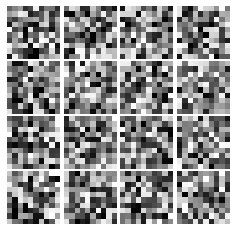

Epoch: 1, Iter: 620, D: 0.3089, G:0.4797


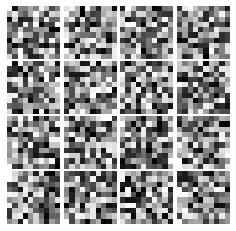

Epoch: 1, Iter: 640, D: 0.1755, G:0.4254


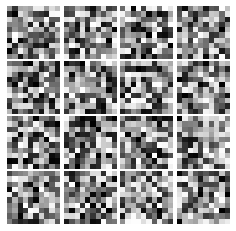

Epoch: 1, Iter: 660, D: 0.1763, G:0.5


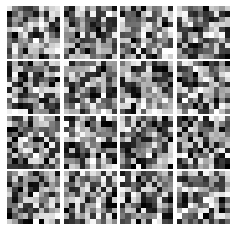

Epoch: 1, Iter: 680, D: 0.1657, G:0.3734


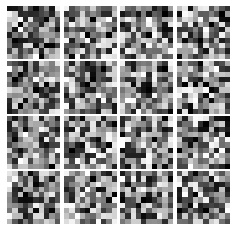

Epoch: 1, Iter: 700, D: 0.1627, G:0.4681


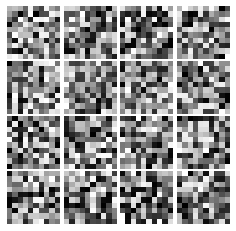

Epoch: 1, Iter: 720, D: 0.1879, G:0.3977


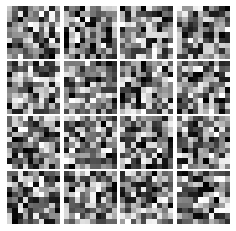

Epoch: 1, Iter: 740, D: 0.1857, G:0.3768


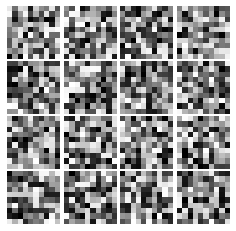

Epoch: 1, Iter: 760, D: 0.2138, G:0.3637


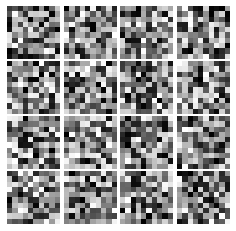

Epoch: 1, Iter: 780, D: 0.2006, G:0.4257


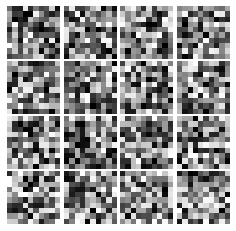

Epoch: 1, Iter: 800, D: 0.1819, G:0.4946


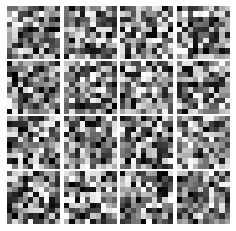

Epoch: 1, Iter: 820, D: 0.2159, G:0.3879


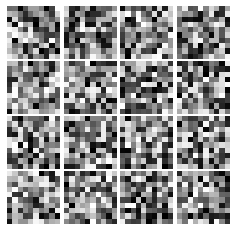

Epoch: 1, Iter: 840, D: 0.1728, G:0.2598


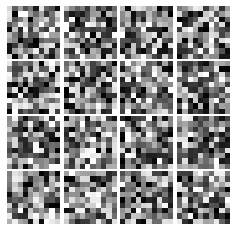

Epoch: 1, Iter: 860, D: 0.1942, G:0.3586


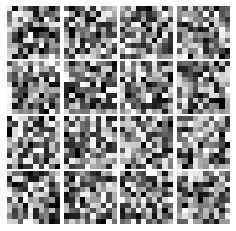

Epoch: 1, Iter: 880, D: 0.1824, G:0.3687


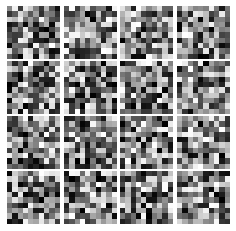

Epoch: 1, Iter: 900, D: 0.2045, G:0.3218


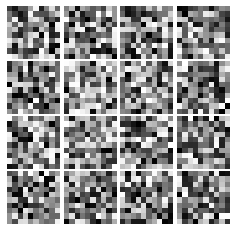

Epoch: 1, Iter: 920, D: 0.2256, G:0.3323


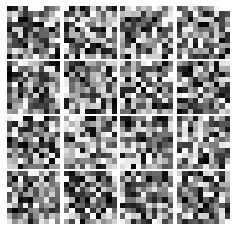

Epoch: 2, Iter: 940, D: 0.1819, G:0.3564


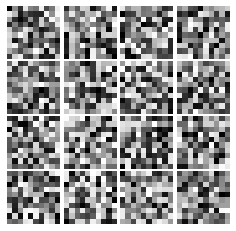

Epoch: 2, Iter: 960, D: 0.1964, G:0.3334


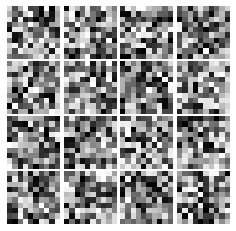

Epoch: 2, Iter: 980, D: 0.1717, G:0.3446


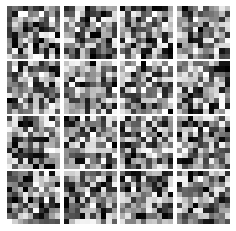

Epoch: 2, Iter: 1000, D: 0.2119, G:0.3064


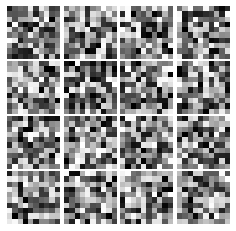

Epoch: 2, Iter: 1020, D: 0.171, G:0.3175


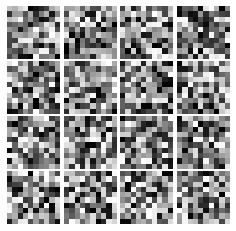

Epoch: 2, Iter: 1040, D: 0.1522, G:0.2542


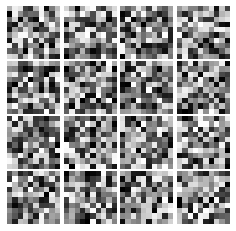

Epoch: 2, Iter: 1060, D: 0.2133, G:0.3219


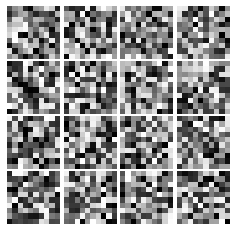

Epoch: 2, Iter: 1080, D: 0.1565, G:0.2825


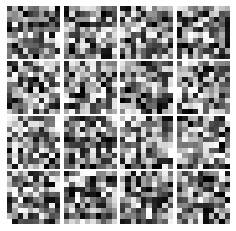

Epoch: 2, Iter: 1100, D: 0.1997, G:0.2768


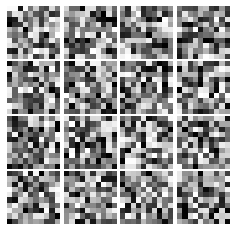

Epoch: 2, Iter: 1120, D: 0.2038, G:0.3515


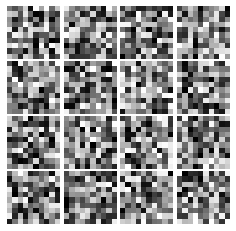

Epoch: 2, Iter: 1140, D: 0.2049, G:0.3064


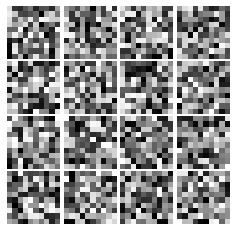

Epoch: 2, Iter: 1160, D: 0.1962, G:0.2677


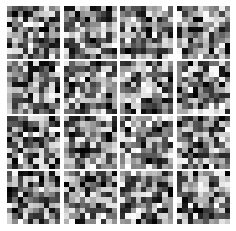

Epoch: 2, Iter: 1180, D: 0.2042, G:0.292


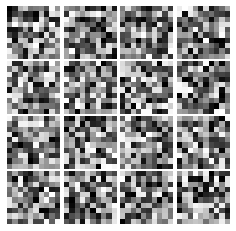

Epoch: 2, Iter: 1200, D: 0.19, G:0.2488


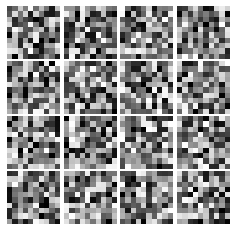

Epoch: 2, Iter: 1220, D: 0.1994, G:0.2801


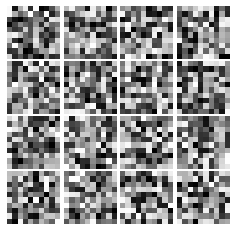

Epoch: 2, Iter: 1240, D: 0.1931, G:0.2813


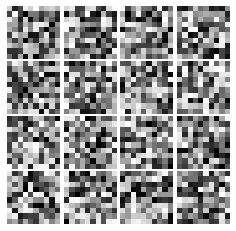

Epoch: 2, Iter: 1260, D: 0.212, G:0.2485


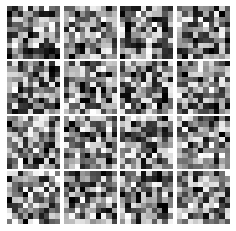

Epoch: 2, Iter: 1280, D: 0.1769, G:0.2425


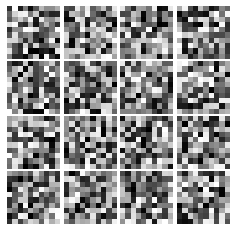

Epoch: 2, Iter: 1300, D: 0.2029, G:0.2164


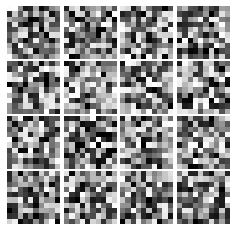

Epoch: 2, Iter: 1320, D: 0.2063, G:0.2367


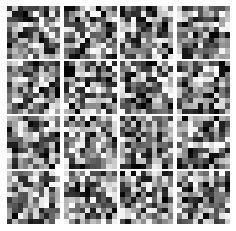

Epoch: 2, Iter: 1340, D: 0.2007, G:0.245


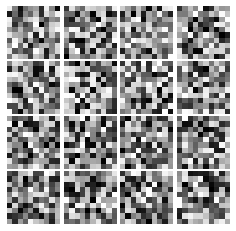

Epoch: 2, Iter: 1360, D: 0.2058, G:0.253


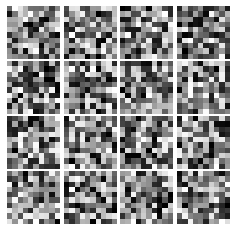

Epoch: 2, Iter: 1380, D: 0.1741, G:0.2839


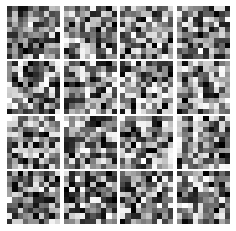

Epoch: 2, Iter: 1400, D: 0.186, G:0.3188


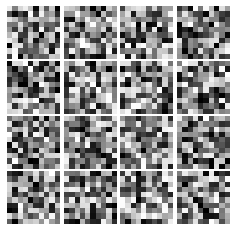

Epoch: 3, Iter: 1420, D: 0.1698, G:0.2702


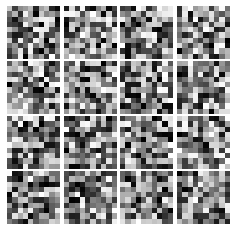

Epoch: 3, Iter: 1440, D: 0.2074, G:0.2766


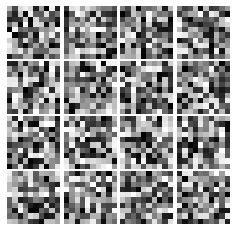

Epoch: 3, Iter: 1460, D: 0.2212, G:0.2618


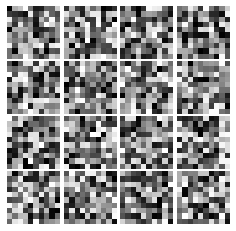

Epoch: 3, Iter: 1480, D: 0.2164, G:0.2243


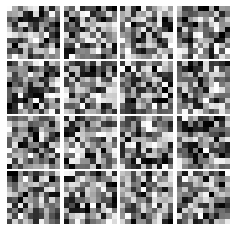

Epoch: 3, Iter: 1500, D: 0.191, G:0.2945


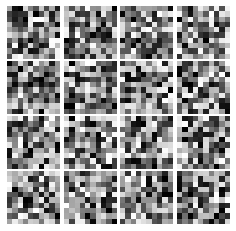

Epoch: 3, Iter: 1520, D: 0.2028, G:0.2636


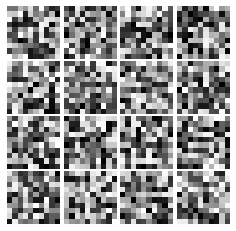

Epoch: 3, Iter: 1540, D: 0.169, G:0.2485


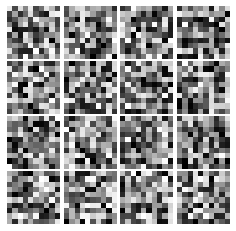

Epoch: 3, Iter: 1560, D: 0.1771, G:0.2367


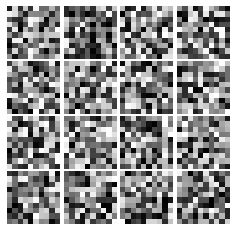

Epoch: 3, Iter: 1580, D: 0.1975, G:0.3113


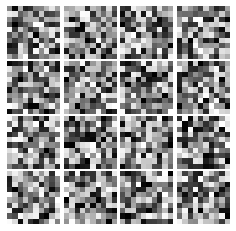

Epoch: 3, Iter: 1600, D: 0.1965, G:0.2476


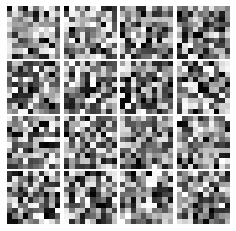

Epoch: 3, Iter: 1620, D: 0.1654, G:0.2725


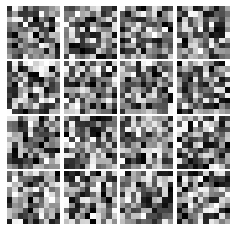

Epoch: 3, Iter: 1640, D: 0.2126, G:0.236


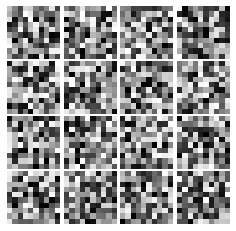

Epoch: 3, Iter: 1660, D: 0.185, G:0.2594


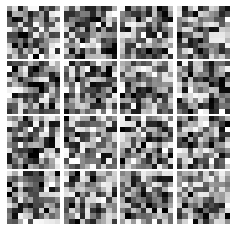

Epoch: 3, Iter: 1680, D: 0.1584, G:0.2638


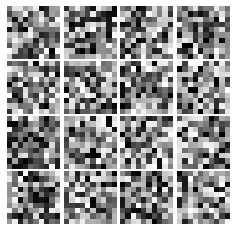

Epoch: 3, Iter: 1700, D: 0.182, G:0.2587


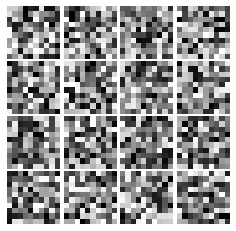

Epoch: 3, Iter: 1720, D: 0.1787, G:0.2465


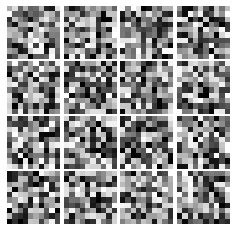

Epoch: 3, Iter: 1740, D: 0.176, G:0.2323


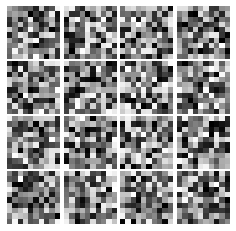

Epoch: 3, Iter: 1760, D: 0.1794, G:0.2856


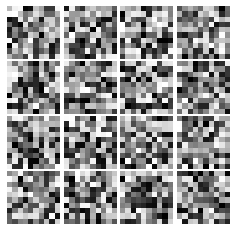

Epoch: 3, Iter: 1780, D: 0.1831, G:0.2126


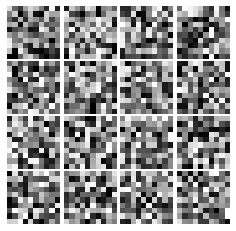

Epoch: 3, Iter: 1800, D: 0.2084, G:0.3065


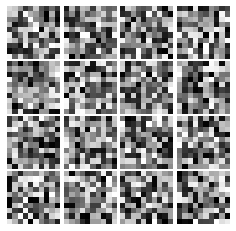

Epoch: 3, Iter: 1820, D: 0.2094, G:0.2295


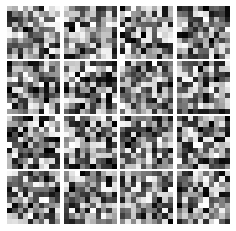

Epoch: 3, Iter: 1840, D: 0.1902, G:0.2819


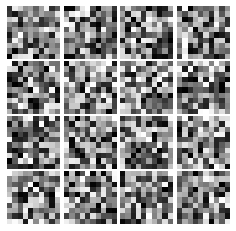

Epoch: 3, Iter: 1860, D: 0.2055, G:0.2664


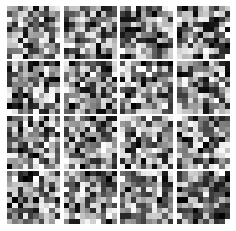

Epoch: 4, Iter: 1880, D: 0.2111, G:0.2143


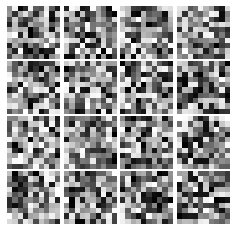

Epoch: 4, Iter: 1900, D: 0.1729, G:0.2511


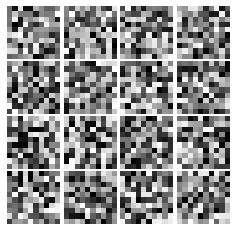

Epoch: 4, Iter: 1920, D: 0.1797, G:0.2761


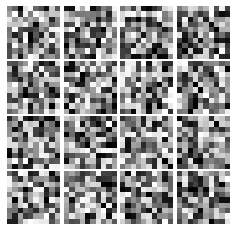

Epoch: 4, Iter: 1940, D: 0.1631, G:0.2538


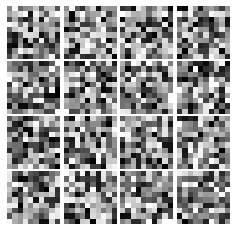

Epoch: 4, Iter: 1960, D: 0.1921, G:0.2546


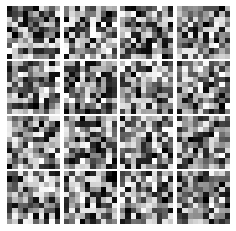

Epoch: 4, Iter: 1980, D: 0.1768, G:0.298


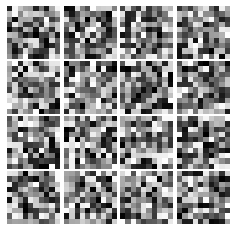

Epoch: 4, Iter: 2000, D: 0.1841, G:0.2527


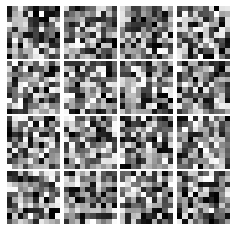

Epoch: 4, Iter: 2020, D: 0.2142, G:0.257


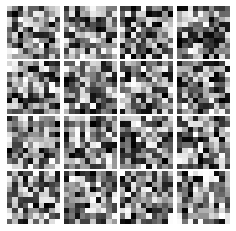

Epoch: 4, Iter: 2040, D: 0.1856, G:0.2411


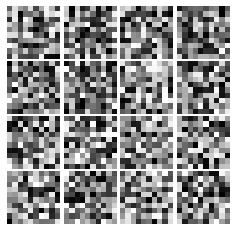

Epoch: 4, Iter: 2060, D: 0.1949, G:0.2553


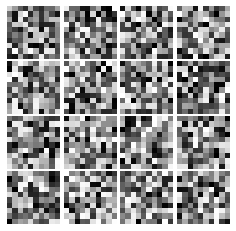

Epoch: 4, Iter: 2080, D: 0.1768, G:0.2687


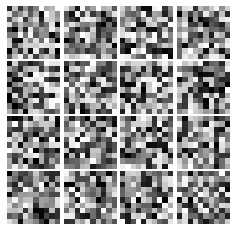

Epoch: 4, Iter: 2100, D: 0.1921, G:0.2601


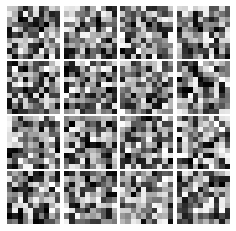

Epoch: 4, Iter: 2120, D: 0.2024, G:0.2301


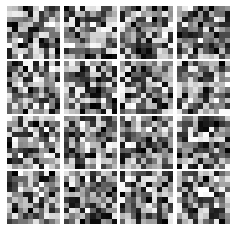

Epoch: 4, Iter: 2140, D: 0.1809, G:0.2338


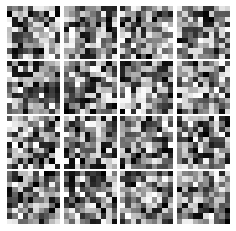

Epoch: 4, Iter: 2160, D: 0.2029, G:0.2579


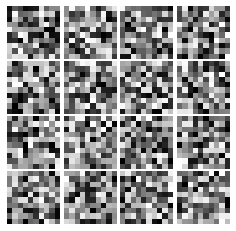

Epoch: 4, Iter: 2180, D: 0.157, G:0.2752


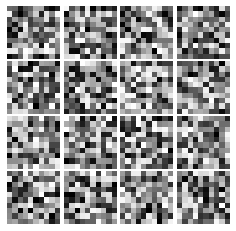

Epoch: 4, Iter: 2200, D: 0.15, G:0.3195


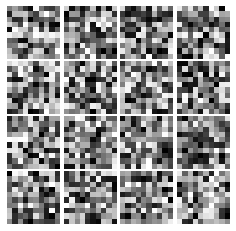

Epoch: 4, Iter: 2220, D: 0.1853, G:0.2501


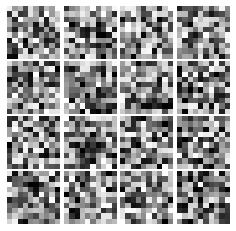

Epoch: 4, Iter: 2240, D: 0.1637, G:0.2576


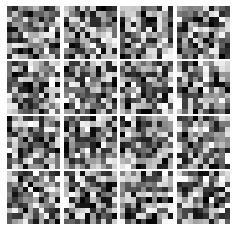

Epoch: 4, Iter: 2260, D: 0.1851, G:0.2739


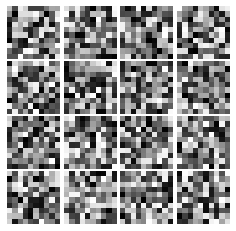

Epoch: 4, Iter: 2280, D: 0.1646, G:0.2951


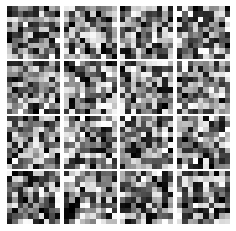

Epoch: 4, Iter: 2300, D: 0.1835, G:0.2691


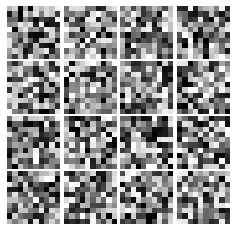

Epoch: 4, Iter: 2320, D: 0.1847, G:0.2942


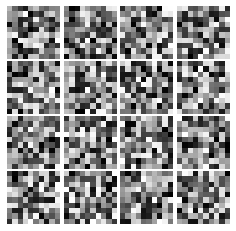

Epoch: 4, Iter: 2340, D: 0.2123, G:0.2642


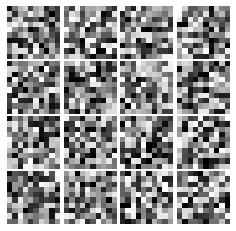

Epoch: 5, Iter: 2360, D: 0.1889, G:0.2496


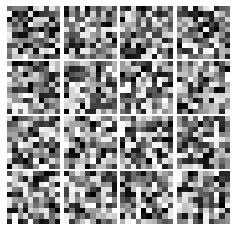

Epoch: 5, Iter: 2380, D: 0.1609, G:0.2589


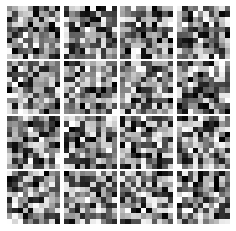

Epoch: 5, Iter: 2400, D: 0.1683, G:0.358


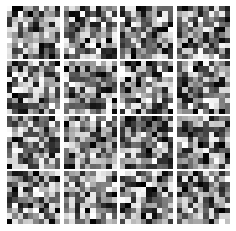

Epoch: 5, Iter: 2420, D: 0.1543, G:0.3255


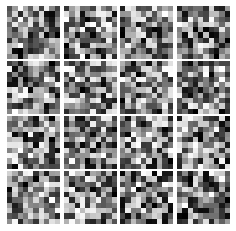

Epoch: 5, Iter: 2440, D: 0.1828, G:0.2994


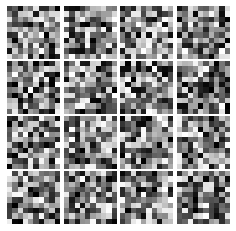

Epoch: 5, Iter: 2460, D: 0.1721, G:0.3674


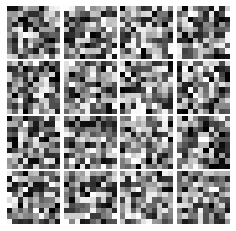

Epoch: 5, Iter: 2480, D: 0.1484, G:0.2709


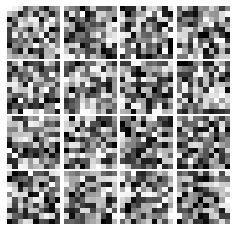

Epoch: 5, Iter: 2500, D: 0.1596, G:0.3638


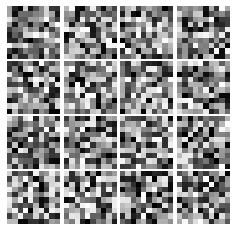

Epoch: 5, Iter: 2520, D: 0.17, G:0.2172


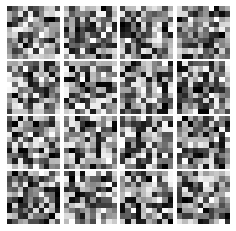

Epoch: 5, Iter: 2540, D: 0.1737, G:0.2737


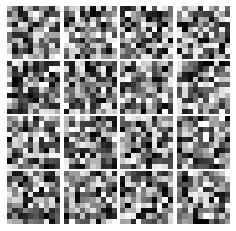

Epoch: 5, Iter: 2560, D: 0.188, G:0.2936


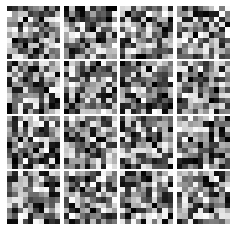

Epoch: 5, Iter: 2580, D: 0.1617, G:0.2723


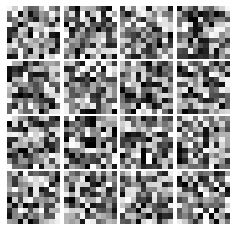

Epoch: 5, Iter: 2600, D: 0.219, G:0.3033


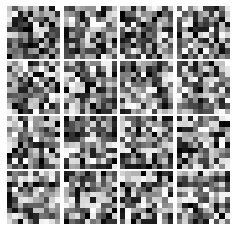

Epoch: 5, Iter: 2620, D: 0.147, G:0.3021


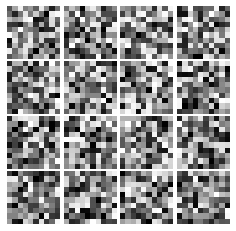

Epoch: 5, Iter: 2640, D: 0.1794, G:0.2542


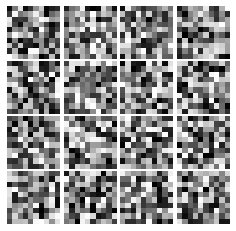

Epoch: 5, Iter: 2660, D: 0.1612, G:0.2747


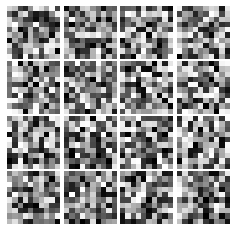

Epoch: 5, Iter: 2680, D: 0.1884, G:0.2465


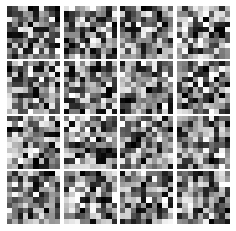

Epoch: 5, Iter: 2700, D: 0.175, G:0.297


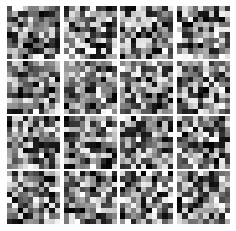

Epoch: 5, Iter: 2720, D: 0.1957, G:0.2488


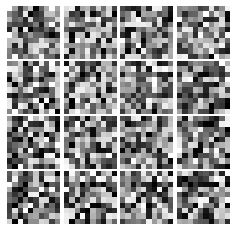

Epoch: 5, Iter: 2740, D: 0.1515, G:0.3338


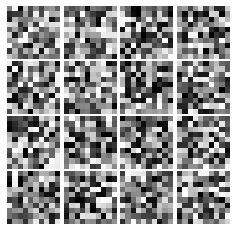

Epoch: 5, Iter: 2760, D: 0.178, G:0.3155


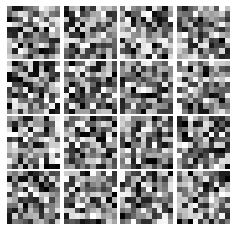

Epoch: 5, Iter: 2780, D: 0.1729, G:0.2669


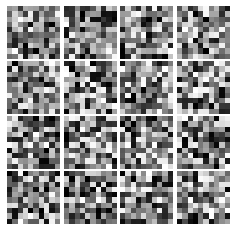

Epoch: 5, Iter: 2800, D: 0.1698, G:0.3073


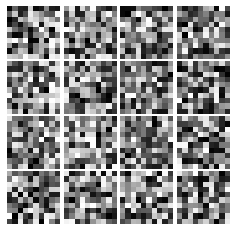

Epoch: 6, Iter: 2820, D: 0.1633, G:0.3168


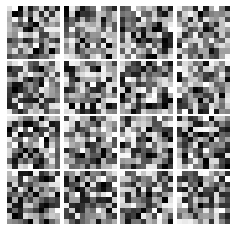

Epoch: 6, Iter: 2840, D: 0.164, G:0.3771


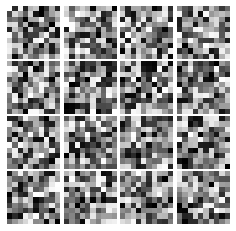

Epoch: 6, Iter: 2860, D: 0.1679, G:0.2735


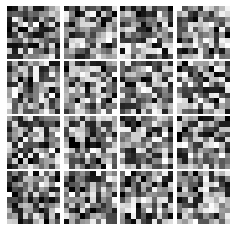

Epoch: 6, Iter: 2880, D: 0.1999, G:0.2131


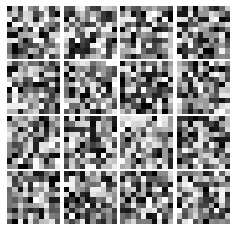

Epoch: 6, Iter: 2900, D: 0.1609, G:0.2999


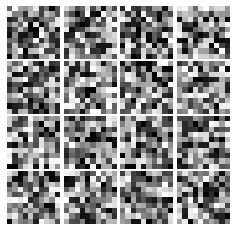

Epoch: 6, Iter: 2920, D: 0.1686, G:0.2606


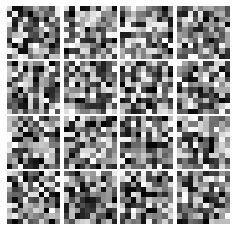

Epoch: 6, Iter: 2940, D: 0.1581, G:0.3163


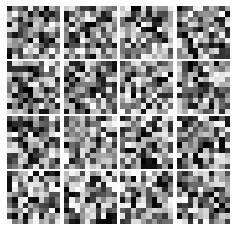

Epoch: 6, Iter: 2960, D: 0.1446, G:0.2985


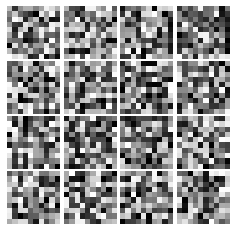

Epoch: 6, Iter: 2980, D: 0.1756, G:0.2875


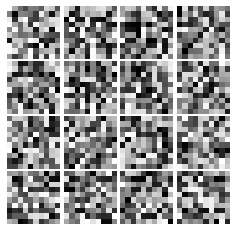

Epoch: 6, Iter: 3000, D: 0.1727, G:0.3048


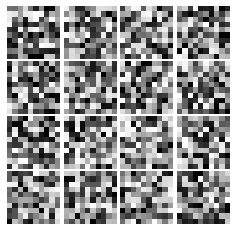

Epoch: 6, Iter: 3020, D: 0.1718, G:0.3055


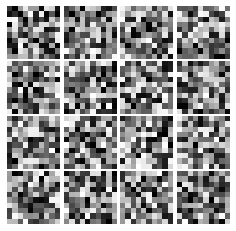

Epoch: 6, Iter: 3040, D: 0.1647, G:0.2911


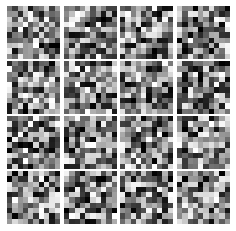

Epoch: 6, Iter: 3060, D: 0.14, G:0.3436


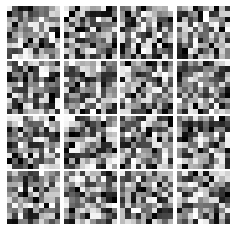

Epoch: 6, Iter: 3080, D: 0.1634, G:0.3081


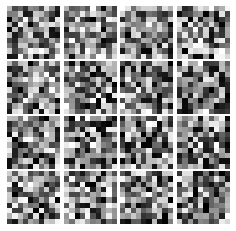

Epoch: 6, Iter: 3100, D: 0.1834, G:0.2731


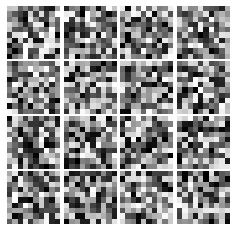

Epoch: 6, Iter: 3120, D: 0.1584, G:0.263


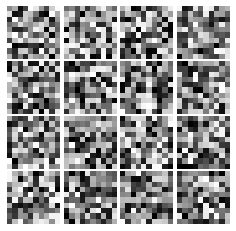

Epoch: 6, Iter: 3140, D: 0.1434, G:0.2588


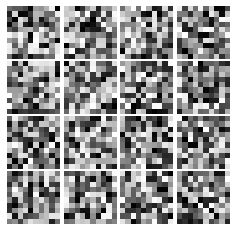

Epoch: 6, Iter: 3160, D: 0.1375, G:0.286


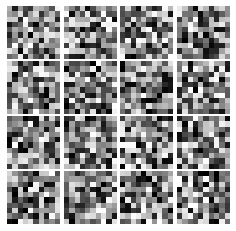

Epoch: 6, Iter: 3180, D: 0.1559, G:0.3198


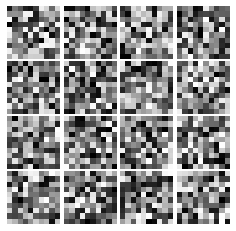

Epoch: 6, Iter: 3200, D: 0.1597, G:0.2587


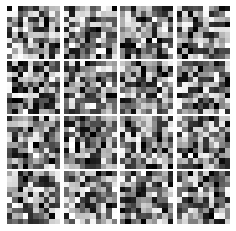

Epoch: 6, Iter: 3220, D: 0.1726, G:0.2848


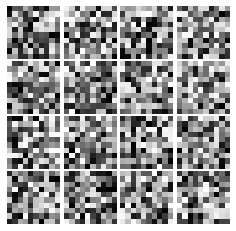

Epoch: 6, Iter: 3240, D: 0.1372, G:0.2936


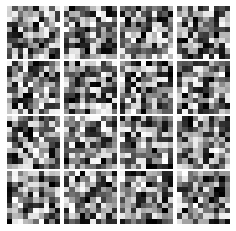

Epoch: 6, Iter: 3260, D: 0.1631, G:0.3133


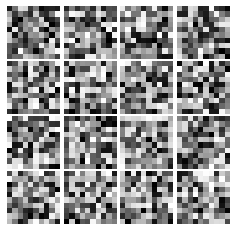

Epoch: 6, Iter: 3280, D: 0.1873, G:0.2512


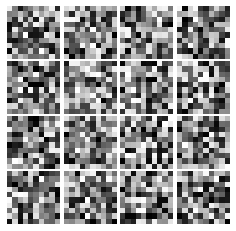

Epoch: 7, Iter: 3300, D: 0.1538, G:0.3162


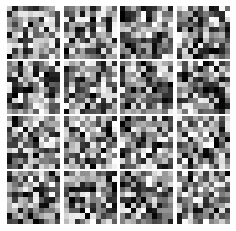

Epoch: 7, Iter: 3320, D: 0.1662, G:0.29


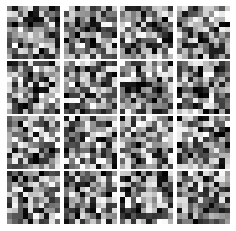

Epoch: 7, Iter: 3340, D: 0.1721, G:0.273


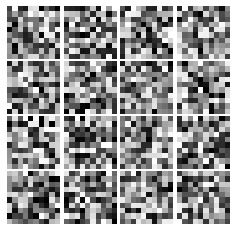

Epoch: 7, Iter: 3360, D: 0.1502, G:0.33


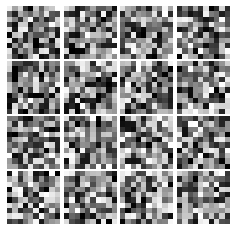

Epoch: 7, Iter: 3380, D: 0.193, G:0.2912


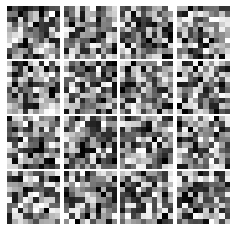

Epoch: 7, Iter: 3400, D: 0.1504, G:0.285


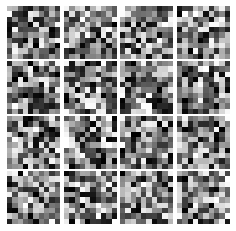

Epoch: 7, Iter: 3420, D: 0.1809, G:0.282


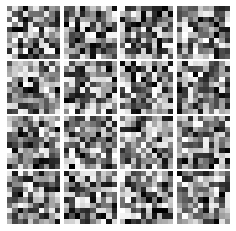

Epoch: 7, Iter: 3440, D: 0.1699, G:0.2777


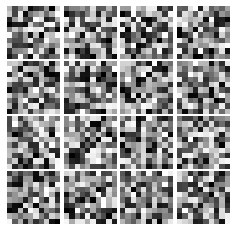

Epoch: 7, Iter: 3460, D: 0.2115, G:0.2651


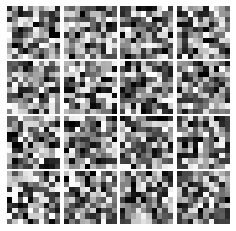

Epoch: 7, Iter: 3480, D: 0.1809, G:0.2751


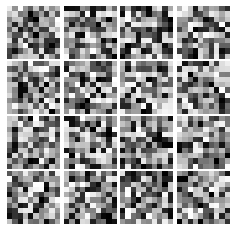

Epoch: 7, Iter: 3500, D: 0.1561, G:0.2697


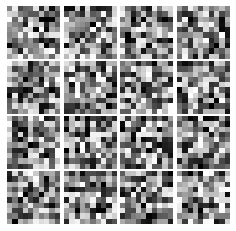

Epoch: 7, Iter: 3520, D: 0.1542, G:0.2833


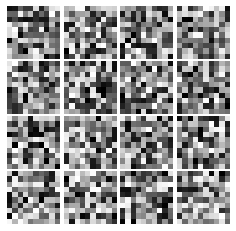

Epoch: 7, Iter: 3540, D: 0.1315, G:0.2956


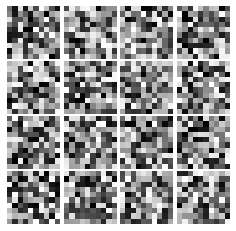

Epoch: 7, Iter: 3560, D: 0.1472, G:0.2916


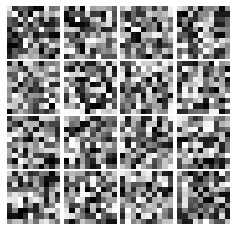

Epoch: 7, Iter: 3580, D: 0.1592, G:0.3026


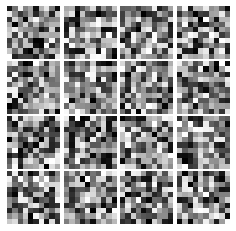

Epoch: 7, Iter: 3600, D: 0.1528, G:0.2718


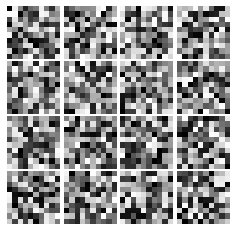

Epoch: 7, Iter: 3620, D: 0.157, G:0.3396


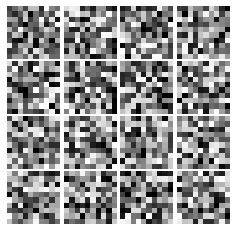

Epoch: 7, Iter: 3640, D: 0.1726, G:0.326


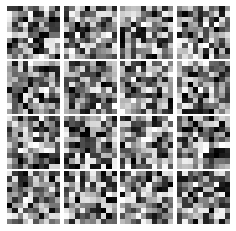

Epoch: 7, Iter: 3660, D: 0.1394, G:0.3161


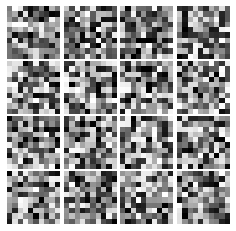

Epoch: 7, Iter: 3680, D: 0.1523, G:0.3277


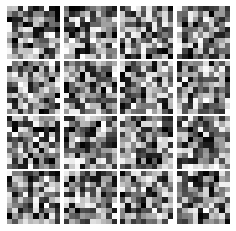

Epoch: 7, Iter: 3700, D: 0.1405, G:0.2797


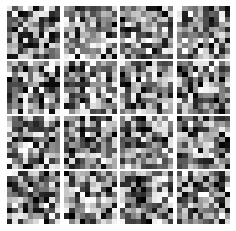

Epoch: 7, Iter: 3720, D: 0.1436, G:0.3926


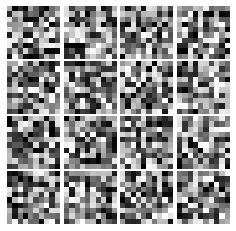

Epoch: 7, Iter: 3740, D: 0.1516, G:0.3039


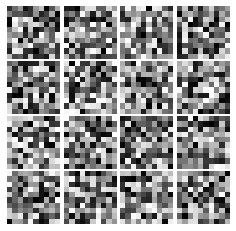

Epoch: 8, Iter: 3760, D: 0.1824, G:0.2689


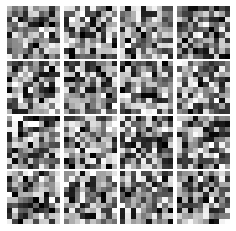

Epoch: 8, Iter: 3780, D: 0.1593, G:0.3057


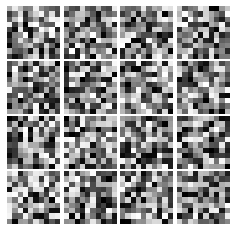

Epoch: 8, Iter: 3800, D: 0.1478, G:0.3709


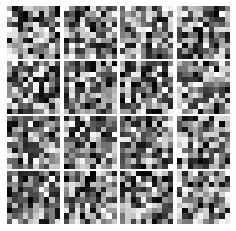

Epoch: 8, Iter: 3820, D: 0.1552, G:0.3113


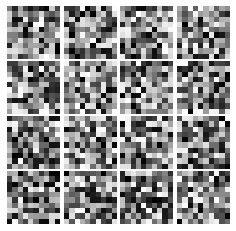

Epoch: 8, Iter: 3840, D: 0.1464, G:0.2787


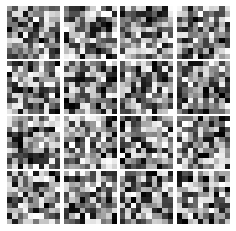

Epoch: 8, Iter: 3860, D: 0.1402, G:0.3111


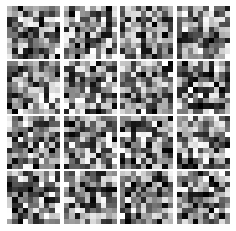

Epoch: 8, Iter: 3880, D: 0.1368, G:0.2857


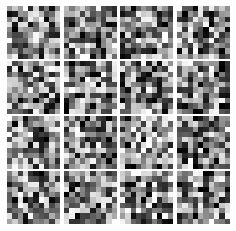

Epoch: 8, Iter: 3900, D: 0.1258, G:0.3024


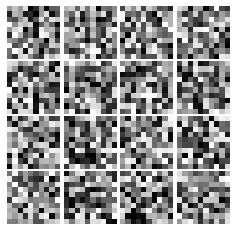

Epoch: 8, Iter: 3920, D: 0.1758, G:0.3154


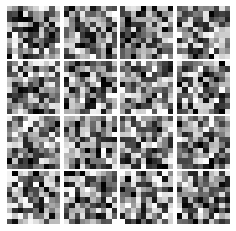

Epoch: 8, Iter: 3940, D: 0.1405, G:0.2948


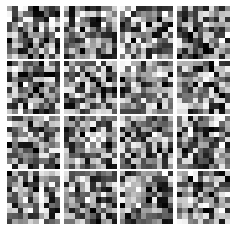

Epoch: 8, Iter: 3960, D: 0.1545, G:0.251


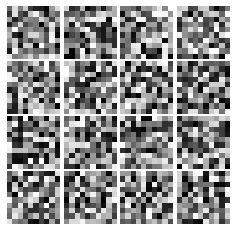

Epoch: 8, Iter: 3980, D: 0.1663, G:0.2937


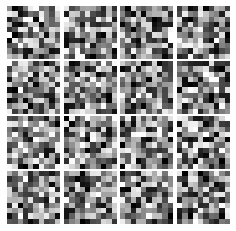

Epoch: 8, Iter: 4000, D: 0.1526, G:0.4055


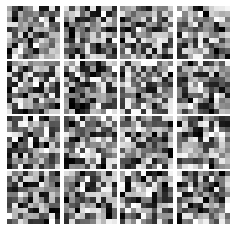

Epoch: 8, Iter: 4020, D: 0.1702, G:0.3624


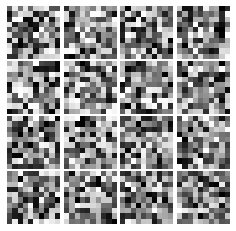

Epoch: 8, Iter: 4040, D: 0.1343, G:0.2832


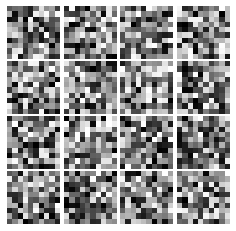

Epoch: 8, Iter: 4060, D: 0.1393, G:0.3263


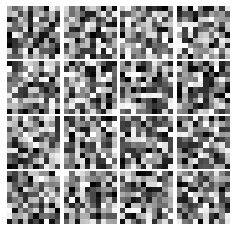

Epoch: 8, Iter: 4080, D: 0.1681, G:0.2378


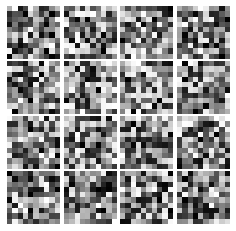

Epoch: 8, Iter: 4100, D: 0.131, G:0.3667


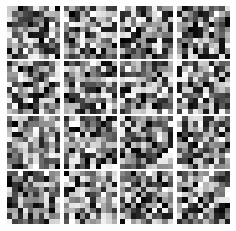

Epoch: 8, Iter: 4120, D: 0.1499, G:0.3182


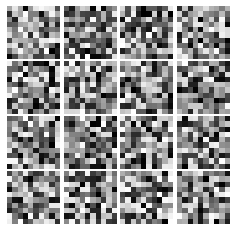

Epoch: 8, Iter: 4140, D: 0.1427, G:0.3806


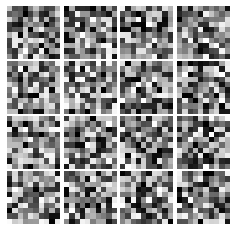

Epoch: 8, Iter: 4160, D: 0.1532, G:0.3674


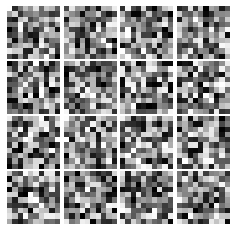

Epoch: 8, Iter: 4180, D: 0.1374, G:0.315


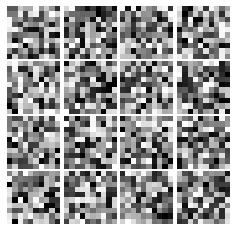

Epoch: 8, Iter: 4200, D: 0.1428, G:0.3634


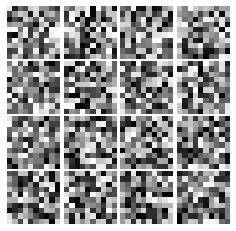

Epoch: 8, Iter: 4220, D: 0.1355, G:0.3688


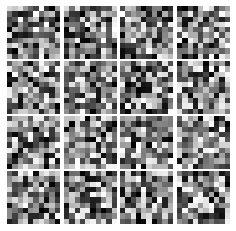

Epoch: 9, Iter: 4240, D: 0.1333, G:0.3796


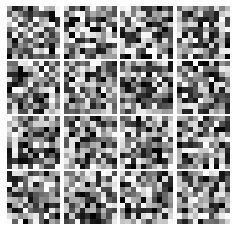

Epoch: 9, Iter: 4260, D: 0.1783, G:0.3009


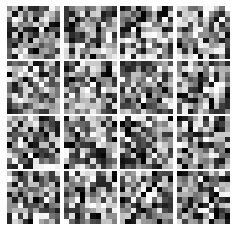

Epoch: 9, Iter: 4280, D: 0.1467, G:0.3374


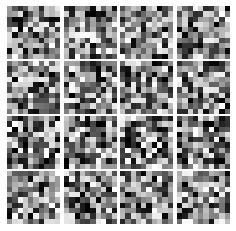

Epoch: 9, Iter: 4300, D: 0.1626, G:0.3048


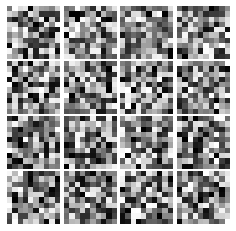

Epoch: 9, Iter: 4320, D: 0.1493, G:0.3829


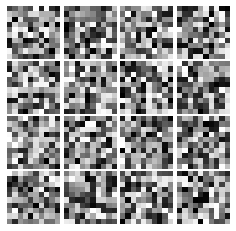

Epoch: 9, Iter: 4340, D: 0.1491, G:0.2995


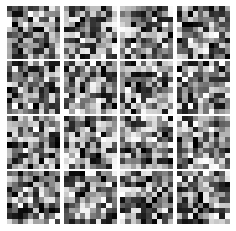

Epoch: 9, Iter: 4360, D: 0.1351, G:0.294


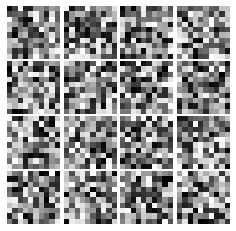

Epoch: 9, Iter: 4380, D: 0.1251, G:0.3195


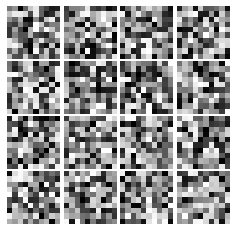

Epoch: 9, Iter: 4400, D: 0.1356, G:0.2993


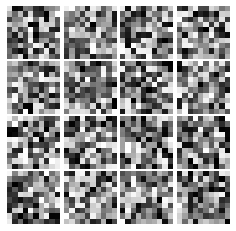

Epoch: 9, Iter: 4420, D: 0.1443, G:0.3551


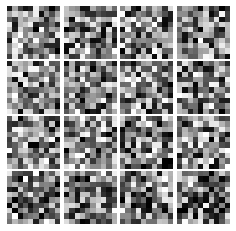

Epoch: 9, Iter: 4440, D: 0.1659, G:0.3331


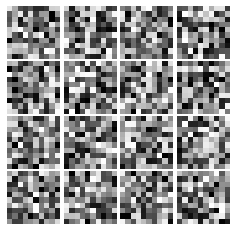

Epoch: 9, Iter: 4460, D: 0.1536, G:0.4293


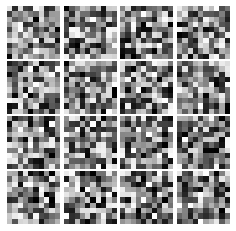

Epoch: 9, Iter: 4480, D: 0.1481, G:0.3625


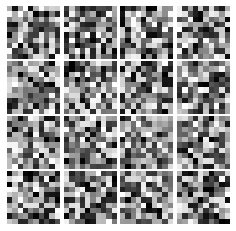

Epoch: 9, Iter: 4500, D: 0.1623, G:0.3065


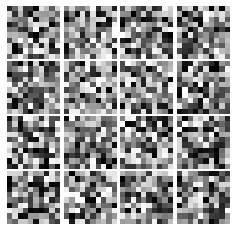

Epoch: 9, Iter: 4520, D: 0.1488, G:0.2981


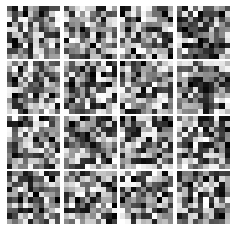

Epoch: 9, Iter: 4540, D: 0.1415, G:0.2857


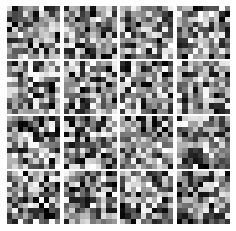

Epoch: 9, Iter: 4560, D: 0.1371, G:0.3414


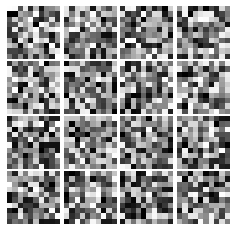

Epoch: 9, Iter: 4580, D: 0.1558, G:0.3323


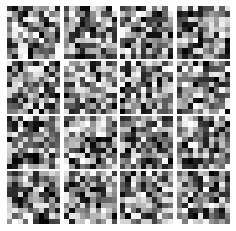

Epoch: 9, Iter: 4600, D: 0.1436, G:0.3686


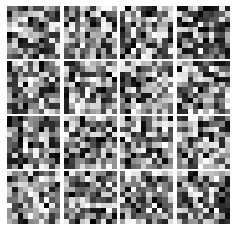

Epoch: 9, Iter: 4620, D: 0.1361, G:0.3473


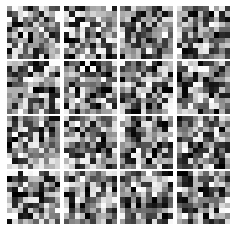

Epoch: 9, Iter: 4640, D: 0.1361, G:0.3934


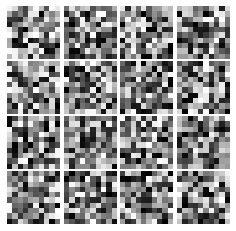

Epoch: 9, Iter: 4660, D: 0.1396, G:0.3002


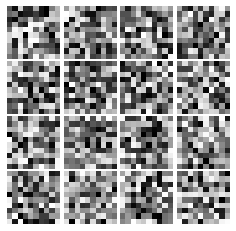

Epoch: 9, Iter: 4680, D: 0.1704, G:0.264


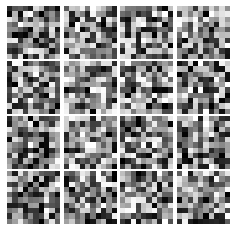

Final images


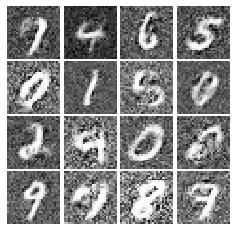

In [ ]:
# YOUR TRAINING CODE HERE
D = discriminator()
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver = tf.keras.optimizers.Adam(learning_rate=1e-3, beta_1=0.5, beta_2=0.999)
G_solver = tf.keras.optimizers.Adam(learning_rate=1e-3, beta_1=0.5, beta_2=0.999)
    
# Run it!
train(D, G, D_solver, G_solver, ls_discriminator_loss, ls_generator_loss)

# Section 2. Deeply Convolutional GANs [45 pts]

In this section, you will need to:
1. Implement DCGAN architecture
2. Train it on MNIST dataset for GAN/LSGAN loss function.

# Deeply Convolutional GANs
In the first part of the notebook, we implemented an almost direct copy of the original GAN network from Ian Goodfellow. However, this network architecture allows no real spatial reasoning. It is unable to reason about things like "sharp edges" in general because it lacks any convolutional layers. Thus, in this section, we will implement some of the ideas from [DCGAN](https://arxiv.org/abs/1511.06434), where we use convolutional networks 

### Section 2.1. DCGAN model architecture [20 pts]
Implement your generator and discriminator model as follows:

#### Discriminator
We will use a discriminator inspired by the TensorFlow MNIST classification [tutorial](https://www.tensorflow.org/get_started/mnist/pros), which is able to get above 99% accuracy on the MNIST dataset fairly quickly. *Be sure to check the dimensions of x and reshape when needed*, fully connected blocks expect [N,D] Tensors while conv2d blocks expect [N,H,W,C] Tensors. Please use `tf.keras.layers` to define the following architecture:

Architecture:
* Conv2D: 32 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Conv2D: 64 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Flatten
* Fully Connected with output size 4 x 4 x 64
* Leaky ReLU(alpha=0.01)
* Fully Connected with output size 1

Once again, please use biases for all convolutional and fully connected layers, and use the default parameter initializers. Note that a padding of 0 can be accomplished with the 'VALID' padding option.

In [ ]:
def DC_Discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    #tf.keras.layers.Dense(1024, use_bias=True,activation='relu',input_shape=(batch_size,noise_dim)),,input_shape=(batch_size, 784)
    #print('x shape',tf.shape(x))
    model = tf.keras.models.Sequential([
                                        tf.keras.layers.Conv2D(filters = 32,kernel_size = (5,5),strides = (1,1),use_bias = True, input_shape = (28,28,1)),
                                        tf.keras.layers.LeakyReLU(alpha=0.01),
                                        tf.keras.layers.MaxPool2D(pool_size = (2,2),strides = (2,2),),
                                        tf.keras.layers.Conv2D(filters = 64,kernel_size = (5,5),strides = (1,1), use_bias = True),
                                        tf.keras.layers.LeakyReLU(alpha=0.01),
                                        tf.keras.layers.MaxPool2D(pool_size = (2,2),strides = (2,2)),
                                        tf.keras.layers.Flatten(),
                                        tf.keras.layers.Dense(4*4*64, use_bias = True),
                                        tf.keras.layers.LeakyReLU(alpha=0.01),
                                        tf.keras.layers.Dense(1, use_bias = True)

        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    
    return model
model = DC_Discriminator()
model.summary()

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_4 (Conv2D)            (None, 24, 24, 32)        832       
_________________________________________________________________
leaky_re_lu_6 (LeakyReLU)    (None, 24, 24, 32)        0         
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 12, 12, 32)        0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 8, 8, 64)          51264     
_________________________________________________________________
leaky_re_lu_7 (LeakyReLU)    (None, 8, 8, 64)          0         
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 4, 4, 64)          0         
_________________________________________________________________
flatten_2 (Flatten)          (None, 1024)             

#### Generator
For the generator, we will copy the architecture exactly from the [InfoGAN paper](https://arxiv.org/pdf/1606.03657.pdf). See Appendix C.1 MNIST. Please use `tf.keras.layers` for your implementation. You might find the documentation for [tf.keras.layers.Conv2DTranspose](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/layers/Conv2DTranspose) useful. The architecture is as follows.

Architecture:
* Fully connected with output size 1024 
* `ReLU`
* BatchNorm
* Fully connected with output size 7 x 7 x 128 
* `ReLU`
* BatchNorm
* Resize into Image Tensor of size 7, 7, 128
* Conv2D^T (transpose): 64 filters of 4x4, stride 2
* `ReLU`
* BatchNorm
* Conv2d^T (transpose): 1 filter of 4x4, stride 2
* `TanH`

Once again, use biases for the fully connected and transpose convolutional layers. Please use the default initializers for your parameters. For padding, choose the 'same' option for transpose convolutions. For Batch Normalization, assume we are always in 'training' mode.

In [ ]:
def DC_Generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
                                        tf.keras.layers.InputLayer([NOISE_DIM],name='noise'),
                                        tf.keras.layers.BatchNormalization(),
                                        tf.keras.layers.Dense(7*7*128, activation='relu'),
                                        tf.keras.layers.BatchNormalization(),
                                        tf.keras.layers.Reshape((7,7,128)),
                                        tf.keras.layers.Conv2DTranspose(64,kernel_size=(4,4),strides = (2,2),activation='relu',padding='same',use_bias=True),
                                        tf.keras.layers.BatchNormalization(),
                                        tf.keras.layers.Conv2DTranspose(1,kernel_size=(4,4),strides = (2,2),activation='tanh',padding='same',use_bias=True)
        
    
    #*****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
   ])   
    return model


model = DC_Generator()
model.summary()

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
batch_normalization_6 (Batch (None, 100)               400       
_________________________________________________________________
dense_6 (Dense)              (None, 6272)              633472    
_________________________________________________________________
batch_normalization_7 (Batch (None, 6272)              25088     
_________________________________________________________________
reshape_2 (Reshape)          (None, 7, 7, 128)         0         
_________________________________________________________________
conv2d_transpose_4 (Conv2DTr (None, 14, 14, 64)        131136    
_________________________________________________________________
batch_normalization_8 (Batch (None, 14, 14, 64)        256       
_________________________________________________________________
conv2d_transpose_5 (Conv2DTr (None, 28, 28, 1)        

### Section 2.2 Train a DCGAN Model with GAN / LSGAN loss function [15 pts]
Now, train your new model with GAN loss function. Observe the visualized result of your model, and describe what you see.

In [ ]:
# YOUR TRAINING CODE HERE
# a giant helper function
def train(D, G, D_solver, G_solver, discriminator_loss, generator_loss,\
              show_every=50, print_every=50, batch_size=128, num_epochs=10, noise_size=100):
    """
    Train loop for GAN.

    The loop will consist of two steps: a discriminator step and a generator step.

    (1) In the discriminator step, first step is to sample noise to generate a fake data batch using the generator. 
    Calculate the discriminator output for real and fake data, and use the output to compute discriminator loss. 
    In code 'd_total_error' is the total discriminator loss.
    
    (2) For the generator step, first step is to sample noise to generate a fake data batch. 
    Get the discriminator output for the fake data batch and use this to compute the generator loss. 
    In code 'g_error' is the generator loss. 
    
    Use the sample_noise function to sample random noise, and the discriminator_loss
    and generator_loss functions for their respective loss computations

    Inputs:
    - D: Discriminator model
    - G: Generator model
    - D_solver: an Optimizer for Discriminator
    - G_solver: an Optimizer for Generator
    - generator_loss: Generator loss
    - discriminator_loss: Discriminator loss
    Returns:
        Nothing
    """
    mnist = MNIST(batch_size=batch_size, shuffle=True)
    
    iter_count = 0
    for epoch in range(num_epochs):
        for (x, _) in mnist:
            with tf.GradientTape() as tape:
                if x.shape[0]==128:
                    real_data = x
                    real_data = tf.convert_to_tensor(real_data)
                    real_data = tf.reshape(real_data,[128,28,28,1])
                else:
                    break 
                ##########################################
                # your code   # Discriminator step       #
                #generate points
                z = sample_noise(batch_size,noise_size)
                fake_images = G(z)
                
                real = D(real_data)
                fake = D(fake_images)
                
                d_total_error = discriminator_loss(real,fake)
                
                ##########################################
                d_gradients = tape.gradient(d_total_error, D.trainable_variables)      
                D_solver.apply_gradients(zip(d_gradients, D.trainable_variables))
            
            with tf.GradientTape() as tape:
                ##########################################
                # your code # Generator step             #
                #generate points
                z = sample_noise(batch_size,noise_size)
                fake_images = G(z)
                fake = D(fake_images)
                g_error = generator_loss(fake)
                #g_error = generator_loss(fake_images)
              
                ##########################################
                g_gradients = tape.gradient(g_error, G.trainable_variables)      
                G_solver.apply_gradients(zip(g_gradients, G.trainable_variables))

            if (iter_count % show_every == 0):
                print('Epoch: {}, Iter: {}, D: {:.4}, G:{:.4}'.format(epoch, iter_count,d_total_error,g_error))
                print ("Type of fake images in print loop", type(fake_images))
                imgs_numpy = fake_images.cpu().numpy()
                show_images(imgs_numpy[0:16])
                plt.show()
            iter_count += 1
    
    # random noise fed into our generator
    z = sample_noise(batch_size, noise_size)
    # generated images
    G_sample = G(z)
    print('Final images')
    show_images(G_sample[:16])
    plt.show()


Epoch: 0, Iter: 0, D: 1.393, G:0.6598
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>
Instructions for updating:
Use tf.identity instead.


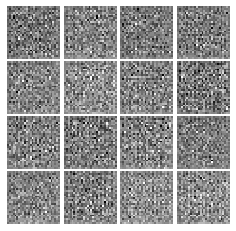

Epoch: 0, Iter: 50, D: 0.0007971, G:7.208
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


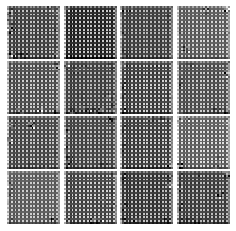

Epoch: 0, Iter: 100, D: 0.0001844, G:8.689
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


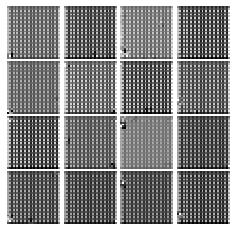

Epoch: 0, Iter: 150, D: 0.0001043, G:9.986
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


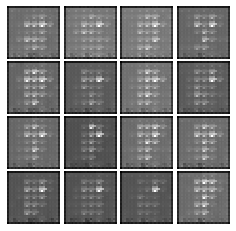

Epoch: 0, Iter: 200, D: 2.101, G:2.654
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


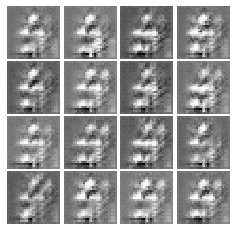

Epoch: 0, Iter: 250, D: 0.6148, G:3.035
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


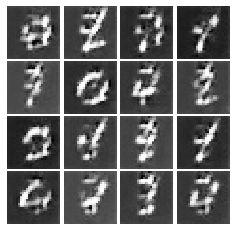

Epoch: 0, Iter: 300, D: 0.2976, G:2.386
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


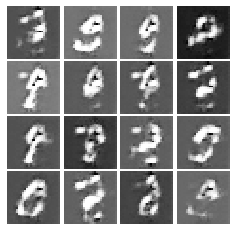

Epoch: 0, Iter: 350, D: 0.4052, G:3.161
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


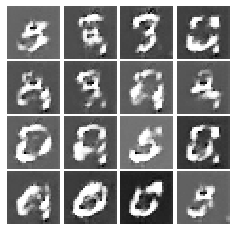

Epoch: 0, Iter: 400, D: 0.5988, G:3.261
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


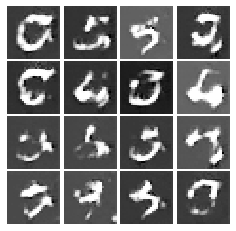

Epoch: 0, Iter: 450, D: 0.3219, G:2.662
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


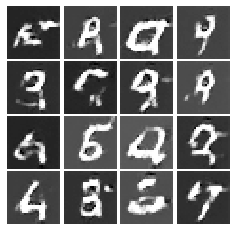

Epoch: 1, Iter: 500, D: 0.3654, G:3.518
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


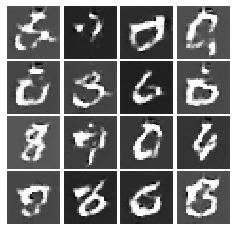

Epoch: 1, Iter: 550, D: 0.4403, G:4.492
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


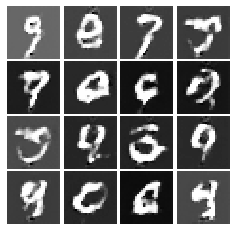

Epoch: 1, Iter: 600, D: 0.3507, G:3.136
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


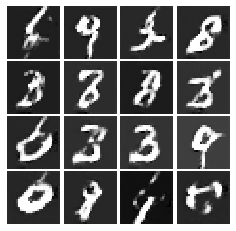

Epoch: 1, Iter: 650, D: 0.4267, G:2.362
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


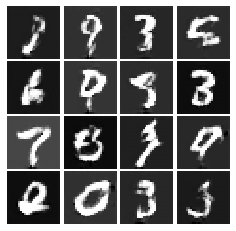

Epoch: 1, Iter: 700, D: 0.3613, G:2.266
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


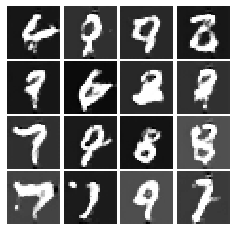

Epoch: 1, Iter: 750, D: 0.5305, G:1.923
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


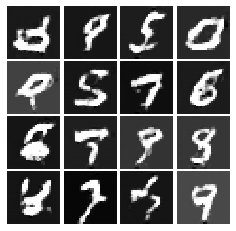

Epoch: 1, Iter: 800, D: 0.5906, G:1.809
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


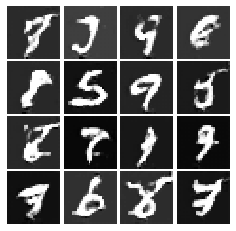

Epoch: 1, Iter: 850, D: 0.5327, G:2.264
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


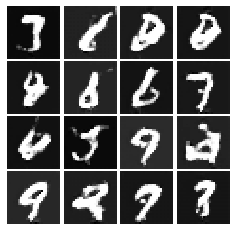

Epoch: 1, Iter: 900, D: 0.4478, G:1.722
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


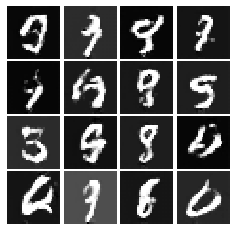

Epoch: 2, Iter: 950, D: 0.2697, G:2.725
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


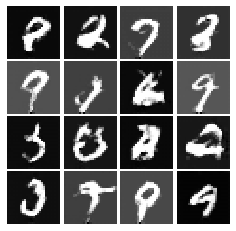

Epoch: 2, Iter: 1000, D: 0.6895, G:1.98
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


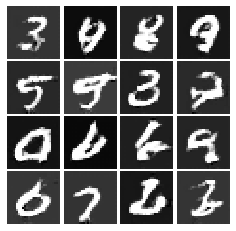

Epoch: 2, Iter: 1050, D: 0.2468, G:3.079
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


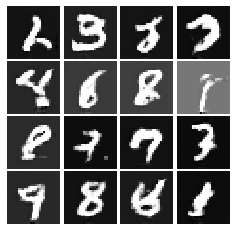

Epoch: 2, Iter: 1100, D: 0.4967, G:3.942
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


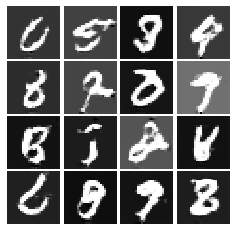

Epoch: 2, Iter: 1150, D: 0.3063, G:3.405
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


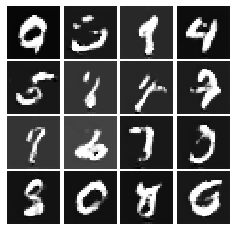

Epoch: 2, Iter: 1200, D: 0.8992, G:2.563
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


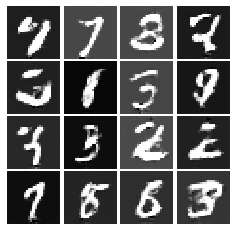

Epoch: 2, Iter: 1250, D: 0.3635, G:3.04
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


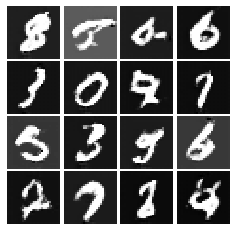

Epoch: 2, Iter: 1300, D: 0.31, G:2.256
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


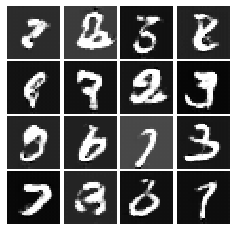

Epoch: 2, Iter: 1350, D: 0.9122, G:3.782
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


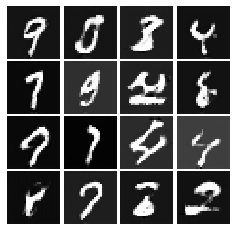

Epoch: 2, Iter: 1400, D: 0.696, G:1.494
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


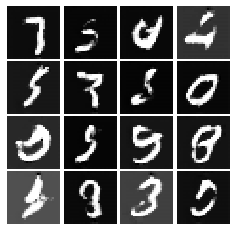

Epoch: 3, Iter: 1450, D: 0.5091, G:3.033
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


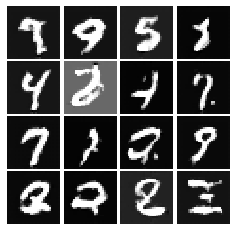

Epoch: 3, Iter: 1500, D: 0.5046, G:2.05
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


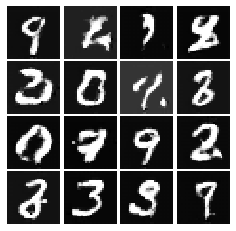

Epoch: 3, Iter: 1550, D: 0.2731, G:2.516
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


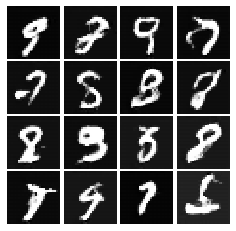

Epoch: 3, Iter: 1600, D: 0.2914, G:2.593
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


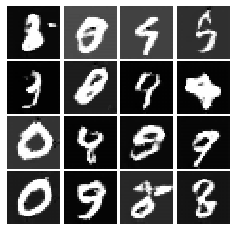

Epoch: 3, Iter: 1650, D: 0.3199, G:4.219
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


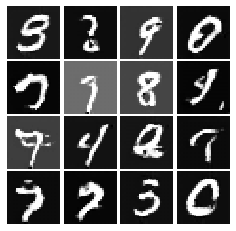

Epoch: 3, Iter: 1700, D: 0.3046, G:3.15
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


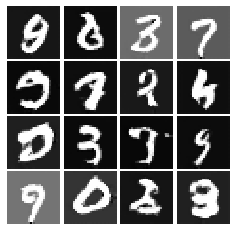

Epoch: 3, Iter: 1750, D: 0.3235, G:3.515
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


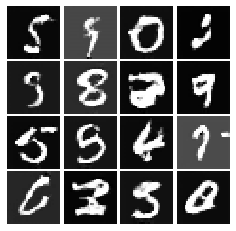

Epoch: 3, Iter: 1800, D: 0.597, G:1.214
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


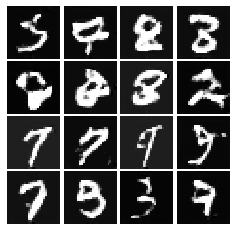

Epoch: 3, Iter: 1850, D: 0.2117, G:2.465
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


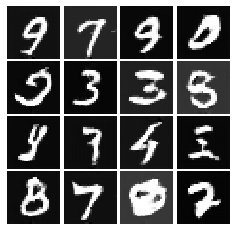

Epoch: 4, Iter: 1900, D: 0.547, G:2.386
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


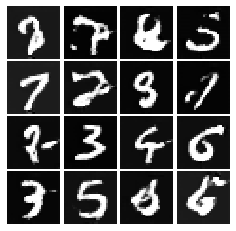

Epoch: 4, Iter: 1950, D: 0.3195, G:2.208
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


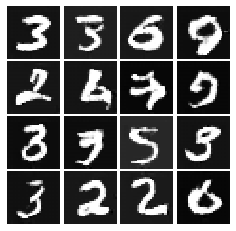

Epoch: 4, Iter: 2000, D: 0.2917, G:3.183
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


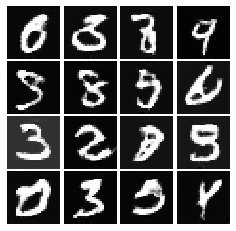

Epoch: 4, Iter: 2050, D: 0.4728, G:2.798
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


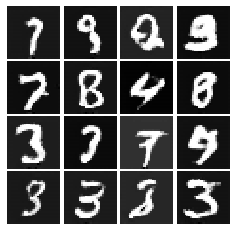

Epoch: 4, Iter: 2100, D: 0.4105, G:2.804
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


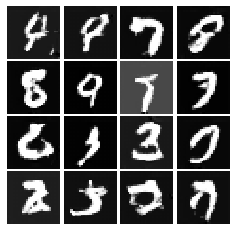

Epoch: 4, Iter: 2150, D: 0.6312, G:4.772
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


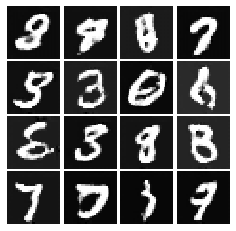

Epoch: 4, Iter: 2200, D: 0.2785, G:2.344
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


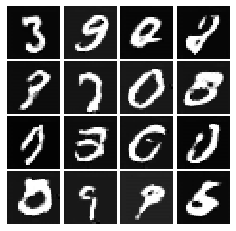

Epoch: 4, Iter: 2250, D: 0.5881, G:2.139
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


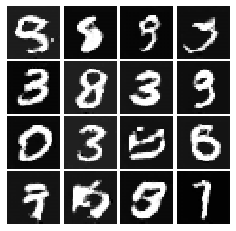

Epoch: 4, Iter: 2300, D: 0.174, G:2.138
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


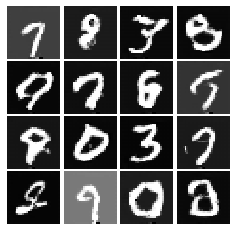

Epoch: 5, Iter: 2350, D: 0.1654, G:2.229
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


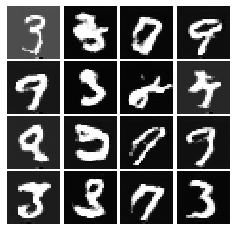

Epoch: 5, Iter: 2400, D: 0.2527, G:3.934
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


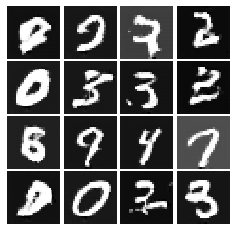

Epoch: 5, Iter: 2450, D: 0.5363, G:3.309
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


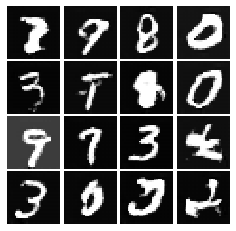

Epoch: 5, Iter: 2500, D: 0.2153, G:3.04
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


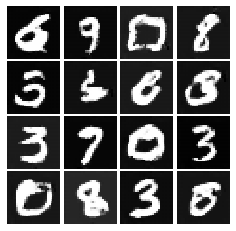

Epoch: 5, Iter: 2550, D: 0.4192, G:4.711
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


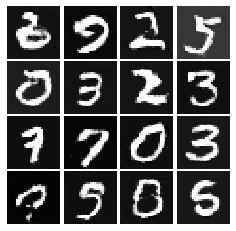

Epoch: 5, Iter: 2600, D: 0.3965, G:3.235
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


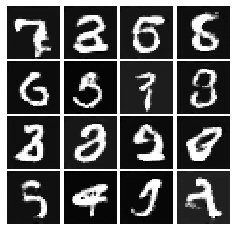

Epoch: 5, Iter: 2650, D: 0.1606, G:2.714
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


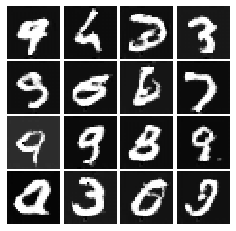

Epoch: 5, Iter: 2700, D: 0.07211, G:3.817
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


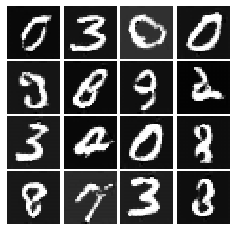

Epoch: 5, Iter: 2750, D: 0.08817, G:3.854
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


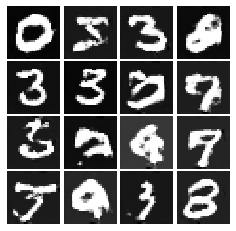

Epoch: 5, Iter: 2800, D: 0.109, G:3.899
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


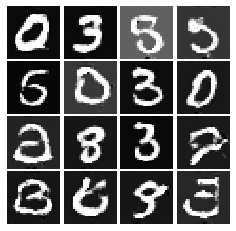

Epoch: 6, Iter: 2850, D: 0.1098, G:5.059
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


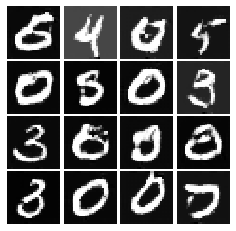

Epoch: 6, Iter: 2900, D: 0.5961, G:6.364
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


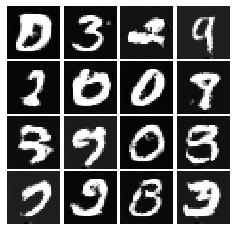

Epoch: 6, Iter: 2950, D: 0.09064, G:6.349
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


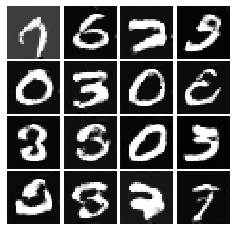

Epoch: 6, Iter: 3000, D: 0.1338, G:5.555
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


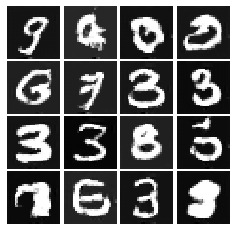

Epoch: 6, Iter: 3050, D: 0.2863, G:4.609
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


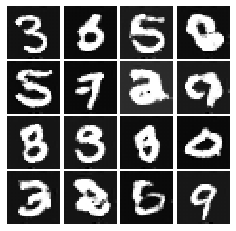

Epoch: 6, Iter: 3100, D: 0.03996, G:4.965
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


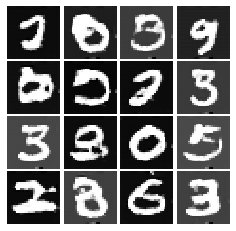

Epoch: 6, Iter: 3150, D: 0.2864, G:7.47
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


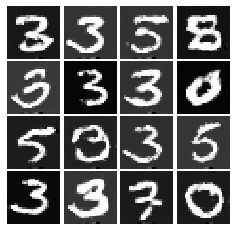

Epoch: 6, Iter: 3200, D: 0.06636, G:7.137
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


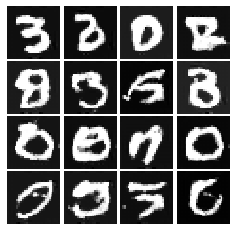

Epoch: 6, Iter: 3250, D: 0.05385, G:4.079
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


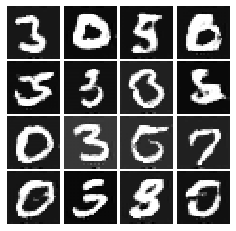

Epoch: 7, Iter: 3300, D: 0.08097, G:4.725
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


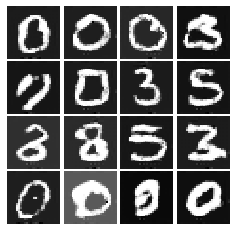

Epoch: 7, Iter: 3350, D: 0.1915, G:6.82
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


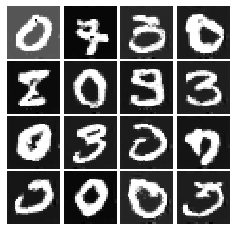

Epoch: 7, Iter: 3400, D: 0.372, G:6.892
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


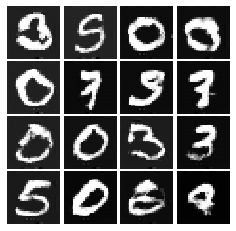

Epoch: 7, Iter: 3450, D: 0.1265, G:5.352
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


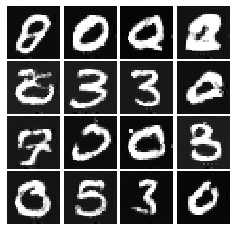

Epoch: 7, Iter: 3500, D: 0.08159, G:4.681
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


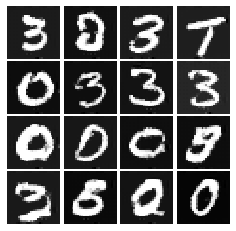

Epoch: 7, Iter: 3550, D: 0.009056, G:7.423
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


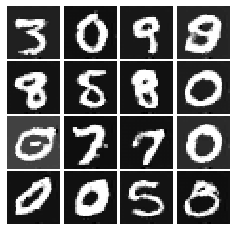

Epoch: 7, Iter: 3600, D: 0.09255, G:7.526
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


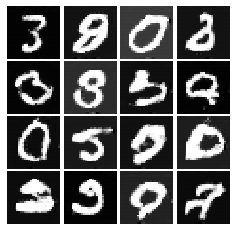

Epoch: 7, Iter: 3650, D: 0.03496, G:7.05
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


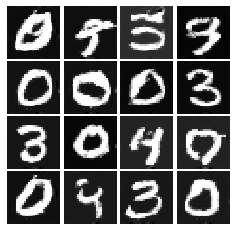

Epoch: 7, Iter: 3700, D: 0.1272, G:5.563
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


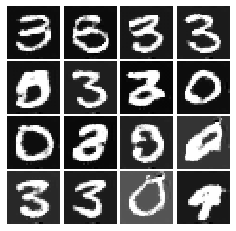

Epoch: 8, Iter: 3750, D: 0.1369, G:8.154
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


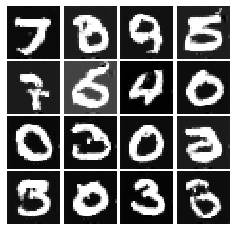

Epoch: 8, Iter: 3800, D: 0.05207, G:4.416
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


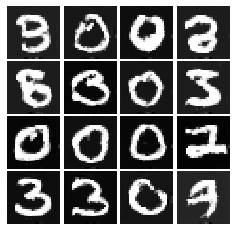

Epoch: 8, Iter: 3850, D: 0.09218, G:3.866
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


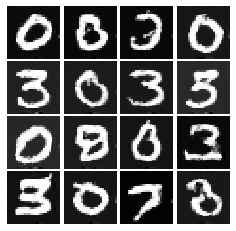

Epoch: 8, Iter: 3900, D: 0.4061, G:5.632
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


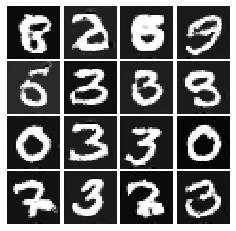

Epoch: 8, Iter: 3950, D: 0.05374, G:5.067
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


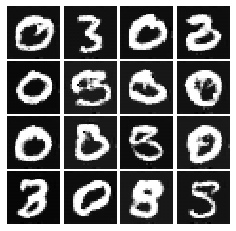

Epoch: 8, Iter: 4000, D: 0.06901, G:4.568
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


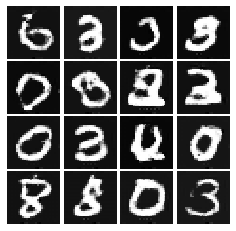

Epoch: 8, Iter: 4050, D: 0.03126, G:7.861
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


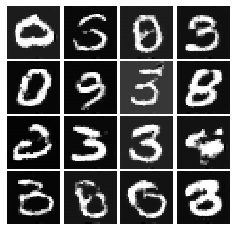

Epoch: 8, Iter: 4100, D: 0.09991, G:3.882
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


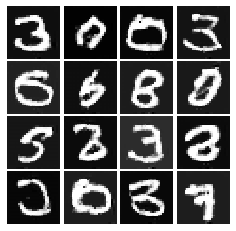

Epoch: 8, Iter: 4150, D: 0.0948, G:7.644
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


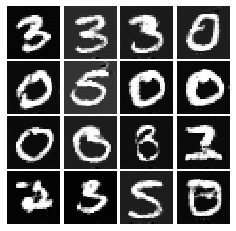

Epoch: 8, Iter: 4200, D: 0.07561, G:7.158
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


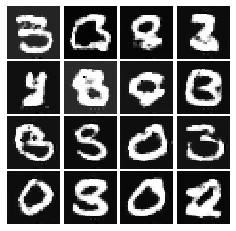

Epoch: 9, Iter: 4250, D: 0.3186, G:5.095
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


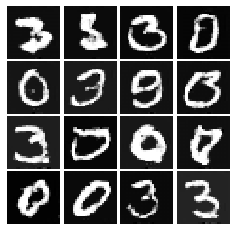

Epoch: 9, Iter: 4300, D: 0.09142, G:4.681
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


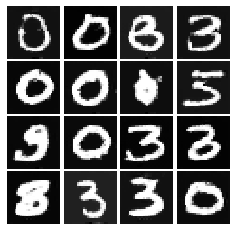

Epoch: 9, Iter: 4350, D: 0.04417, G:4.823
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


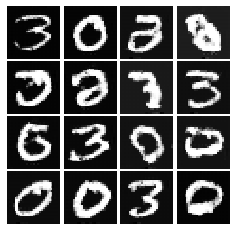

Epoch: 9, Iter: 4400, D: 0.04647, G:6.618
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


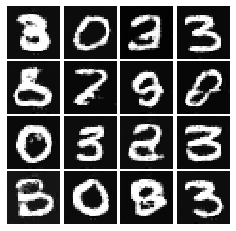

Epoch: 9, Iter: 4450, D: 0.007202, G:6.727
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


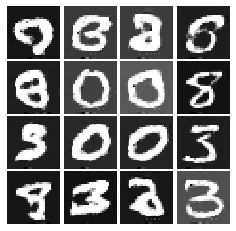

Epoch: 9, Iter: 4500, D: 0.09873, G:8.318
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


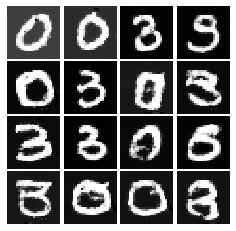

Epoch: 9, Iter: 4550, D: 0.006677, G:5.958
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


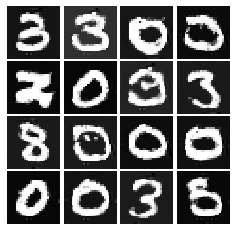

Epoch: 9, Iter: 4600, D: 0.1051, G:5.998
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


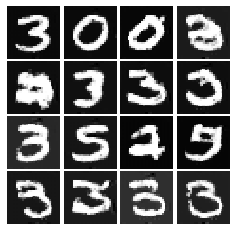

Epoch: 9, Iter: 4650, D: 0.1535, G:5.295
Type of fake images in print loop <class 'tensorflow.python.framework.ops.EagerTensor'>


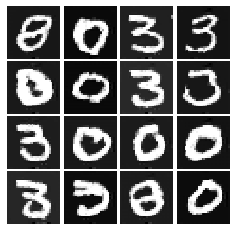

Final images


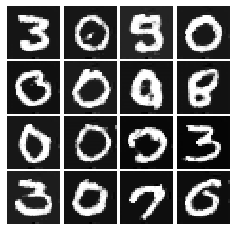

In [ ]:
# YOUR TRAINING CODE HERE
D = DC_Discriminator()
G = DC_Generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver = tf.keras.optimizers.Adam(learning_rate=1e-3, beta_1=0.5, beta_2=0.999)
G_solver = tf.keras.optimizers.Adam(learning_rate=1e-3, beta_1=0.5, beta_2=0.999)
    
# Run it!
train(D, G, D_solver, G_solver, discriminator_loss, generator_loss)

Now, train your DCGAN model with LSGAN loss function. Observe the visualized result of your model, and describe what you see.

In [ ]:
# YOUR TRAINING CODE HERE
# YOUR TRAINING CODE HERE
D = DC_Discriminator()
G = DC_Generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver = tf.keras.optimizers.Adam(learning_rate=1e-3, beta_1=0.5, beta_2=0.999)
G_solver = tf.keras.optimizers.Adam(learning_rate=1e-3, beta_1=0.5, beta_2=0.999)
    
# Run it!
train(D, G, D_solver, G_solver, ls_discriminator_loss, ls_generator_loss)

### Section 2.3 Conclusion. [10 pts]
You have successfully trained you GAN models. Hurray! Now, we want you to answer the following question in few sentences.
1. Have you observed any difference between GAN and LSGAN (e.g. training, generation quality)?
2. What is the difference between output of the simple GAN (Part 1) and output of the DCGAN ? 
3. How can you quantitatively evaluate your GAN model? Is the metric(s) meaningful? Is there any drawback about this metric(s)?

1. LSGAN generated bit more sharper and more clearer images compared to GAN.
2. DCGAN worked best amonst all. the images were sharper from very early epoch.
3. KL-divergence: it is the measure of how similar two models are.
Inception Score:is also widely accepted measure for evaluating GANs,it is used to capture the desirable properties of generated samples that is
highly classifiable and diverse with respect to class labels. 
But its limitation would be , that it fails to detect whether a model has been trapped into one bad mode (i.e. is agnostic to mode collapse). [[Zhou et al](https://openreview.net/forum?id=HyyP33gAZ)].